# TRABAJO INTEGRADOR - DATA SCIENCE - 2022
## Tema: Créditos Prendarios

**Los objetivos identificados del negocio son los siguientes:**

- Entender el comportamiento de los clientes con el fin de que la entidad pueda generar ofertas diferenciadas, mediante una solución analítica.
- Controlar la mora, a través de la adjudicación de la joya y el entendimiento de sus clientes, mediante una solución analítica.

```

```


![Imagen](Portada.jpg)

Link del word del trabajo integrador: [Trabajo integrador](https://1drv.ms/u/s!At02E1M_3GSWdJJzazWgNuB7BO4?e=DMR1b5)


## 1. Explorando los datos de los créditos prendarios

```
```
- *Vamos a instalar los paquetes de Python que se requeriran en el presente trabajo*


In [1]:
#pip install pyreadstat 

In [2]:
#pip install pyprojroot

- *Instalaremos las librerias y se iniciara con el la exploración de los datos.*

In [3]:
#importamos librerias
import pyreadstat
import pandas as pd
from pyprojroot import here 
#from time import time, ctime
import datetime
#from janitor import clean_names
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
#Cargando la data
#data, meta = pyreadstat.read_sav(here('D:\DATA SCIENCE\SESIONES\PROYECTO INTEGRADOR\Proyecto_Integrador') / "Input/Credito prendario.sav")
data, meta = pyreadstat.read_sav(here() / "Input/Credito prendario.sav")
#data, meta = pyreadstat.read_sav(here('C:\\Users\ANALISTAUP29\\Documents\\Proyecto_Integrador') / "Input/Credito prendario.sav")

In [5]:
#revisando un caso aleatorio
#data = data[data.CodCli == 1090300005568]

In [6]:
#Mirando las variables y algunos datos de la base
data.head()

,Periodo,CodCli,Edad,Sexo,EstaCiv,TipoViv,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,FlagAtra,MaxDiasAtra,MaxGramOro,FechAnalisis,AntiDias,FlagAdj
0,200705.0,1.090300e+12,69.0,1.0,1.0,1.0,2.0,2613.74,2549.54,2736.90,551.0,2690.89,0.0,6.0,45.4166,1.341369e+10,220.0,0.0
1,200705.0,1.090300e+12,55.0,0.0,5.0,4.0,2.0,2782.07,1488.64,3051.00,1327.0,1790.80,0.0,33.0,50.6250,1.341619e+10,233.0,0.0
2,200705.0,1.090300e+12,55.0,0.0,1.0,4.0,1.0,1407.21,1205.06,1473.52,1645.0,4315.00,0.0,28.0,24.4500,1.342328e+10,327.0,0.0
3,200705.0,1.090300e+12,61.0,0.0,1.0,4.0,2.0,658.70,429.95,1095.28,424.0,399.62,1.0,28.0,12.4500,1.340729e+10,127.0,1.0
4,200705.0,1.090300e+12,59.0,0.0,5.0,4.0,2.0,2162.62,2148.78,2264.52,1213.0,1642.20,0.0,46.0,37.5750,1.342051e+10,275.0,0.0


In [7]:
#Información de las variables, para ver si existen nulos
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 961984 entries, 0 to 961983
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Periodo         961984 non-null  float64
 1   CodCli          961984 non-null  float64
 2   Edad            961984 non-null  float64
 3   Sexo            961984 non-null  float64
 4   EstaCiv         961984 non-null  float64
 5   TipoViv         961984 non-null  float64
 6   CantCred        961984 non-null  float64
 7   Desem           961984 non-null  float64
 8   SalVigSol       961984 non-null  float64
 9   Monto_Tasación  961984 non-null  float64
 10  DiasEfec        961984 non-null  float64
 11  MaxDeuda        961984 non-null  float64
 12  FlagAtra        961984 non-null  float64
 13  MaxDiasAtra     961984 non-null  float64
 14  MaxGramOro      961984 non-null  float64
 15  FechAnalisis    961984 non-null  float64
 16  AntiDias        961984 non-null  float64
 17  FlagAdj   

In [8]:
# No hay no nulos

In [9]:
#Diccionario
'''

Periodo	Periodo
CodCli	Código de Cliente
Edad	Edad
Sexo	Sexo
EstaCiv	Estado civil
TipoViv	Tipo de vivienda
CantCred	Cantidad de créditos
Desem	Desembolso
SalVigSol	Saldo vigente en soles
Monto_Tasación	Monto de tasación
DiasEfec	Dias efectivos
MaxDeuda	Máxima deuda
FlagAtra	Flag de dias de atraso
MaxDiasAtra	Maximo dias de atraso
MaxGramOro	Maximo gramo en oro
FechAnalisis	Fecha de analisis
AntiDias	Antiguedad en dias
FlagAdj	Falg adjudicación

'''

'\n\nPeriodo\tPeriodo\nCodCli\tCódigo de Cliente\nEdad\tEdad\nSexo\tSexo\nEstaCiv\tEstado civil\nTipoViv\tTipo de vivienda\nCantCred\tCantidad de créditos\nDesem\tDesembolso\nSalVigSol\tSaldo vigente en soles\nMonto_Tasación\tMonto de tasación\nDiasEfec\tDias efectivos\nMaxDeuda\tMáxima deuda\nFlagAtra\tFlag de dias de atraso\nMaxDiasAtra\tMaximo dias de atraso\nMaxGramOro\tMaximo gramo en oro\nFechAnalisis\tFecha de analisis\nAntiDias\tAntiguedad en dias\nFlagAdj\tFalg adjudicación\n\n'

In [10]:
# Obtener variables númericas
num_cols = [i for i in data.columns 
            if ((data[i].dtype == float) | (data[i].dtype == np.int64))]

print(num_cols)

['Periodo', 'CodCli', 'Edad', 'Sexo', 'EstaCiv', 'TipoViv', 'CantCred', 'Desem', 'SalVigSol', 'Monto_Tasación', 'DiasEfec', 'MaxDeuda', 'FlagAtra', 'MaxDiasAtra', 'MaxGramOro', 'FechAnalisis', 'AntiDias', 'FlagAdj']


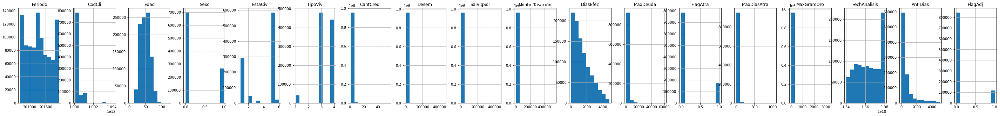

In [11]:
plt.rcParams['figure.figsize'] = [50,5] ## ajustar la grafica al tamaño 10,4
data[num_cols].hist(layout = (1,18))
plt.show()
plt.rcParams['figure.figsize'] = [6.4, 4.8] 

In [12]:
data.describe().T.apply(lambda s: s.apply('{0:.2f}'.format))  ## describe las variables

,count,mean,std,min,25%,50%,75%,max
Periodo,961984.00,201286.78,358.53,200705.00,201003.00,201302.00,201604.00,201912.00
CodCli,961984.00,1090327278735.55,494787275.28,1090100000043.00,1090100340197.00,1090100829692.00,1090400019861.00,1094200000159.00
Edad,961984.00,49.32,14.01,4.00,38.00,49.00,59.00,121.00
Sexo,961984.00,0.28,0.45,0.00,0.00,0.00,1.00,1.00
EstaCiv,961984.00,3.64,1.87,1.00,1.00,5.00,5.00,6.00
TipoViv,961984.00,3.37,0.70,1.00,3.00,3.00,4.00,4.00
CantCred,961984.00,1.46,1.09,1.00,1.00,1.00,2.00,56.00
Desem,961984.00,1321.89,2253.26,0.00,402.52,765.00,1496.00,455218.04
SalVigSol,961984.00,1141.98,2106.71,0.00,324.41,630.00,1275.98,455218.04
Monto_Tasación,961984.00,1534.60,2538.67,48.60,475.20,897.60,1740.00,535552.80


In [13]:
#Para agregar porcentajes

def with_hue(ax, feature, Number_of_categories, hue_categories):
    a = [p.get_height() for p in ax.patches]
    patch = [p for p in ax.patches]
    for i in range(Number_of_categories):
        total = feature.value_counts().values[i]
        for j in range(hue_categories):
            percentage = '{:.1f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
            x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 - 0.15
            y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() 
            ax.annotate(percentage, (x, y), size = 12)

def without_hue(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

'\n1: La caja se adjudica la joya (Se queda con el bien del cliente)  -->  87.8%\n0: La caja no se adjudica la joya (Devuelve el bien al cliente)  -->    12.2%\n\n'

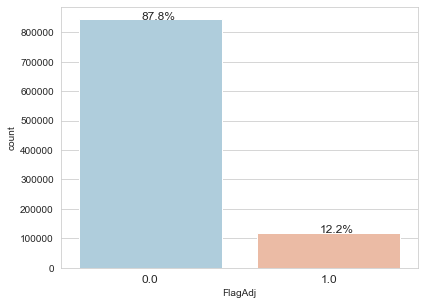

In [14]:
# Analizando la variable que representa el Tarjet del negocio (FlagAdj)

sns.set_style('whitegrid')
ax=sns.countplot(x='FlagAdj',data=data,palette='RdBu_r')

plt.xticks(size=12)

without_hue(ax,data.FlagAdj)

'''
1: La caja se adjudica la joya (Se queda con el bien del cliente)  -->  87.8%
0: La caja no se adjudica la joya (Devuelve el bien al cliente)  -->    12.2%

'''


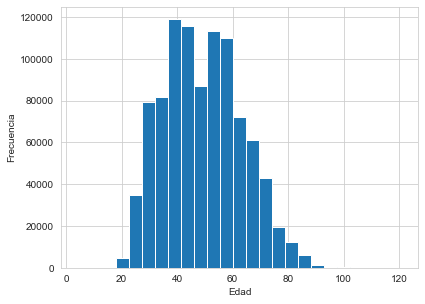

In [15]:
# Analizando la Edad

data['Edad'].hist(bins=25) 
plt.xlabel("Edad")
plt.ylabel("Frecuencia")
plt.show()


<AxesSubplot:xlabel='Edad'>

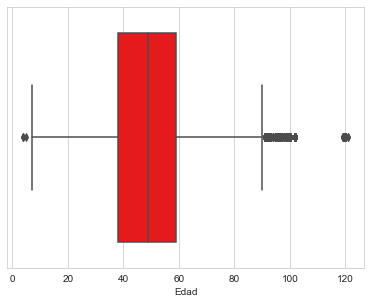

In [16]:
sns.boxplot(x="Edad",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [17]:
 #Intervalo de cantidad de edad
import math

k = 1 + 3.322 * math.log10(len(data['Edad']))
periodos = math.ceil(k)

inf = data['Edad'].min()        # Limite inferior del primer intervalo
dif = data['Edad'].max()
sup = data['Edad'].max()        # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['Edad'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[4.0, 9.85)",21,6.925,4.00,9.85
"[9.85, 15.7)",28,12.775,9.85,15.70
"[15.7, 21.549999999999997)",2785,18.625,15.70,21.55
"[21.549999999999997, 27.4)",36439,24.475,21.55,27.40
"[27.4, 33.25)",98211,30.325,27.40,33.25
"[33.25, 39.099999999999994)",133456,36.175,33.25,39.10
"[39.099999999999994, 44.949999999999996)",117579,42.025,39.10,44.95
"[44.949999999999996, 50.8)",133702,47.875,44.95,50.80
"[50.8, 56.65)",135209,53.725,50.80,56.65


'\n#EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO\n'

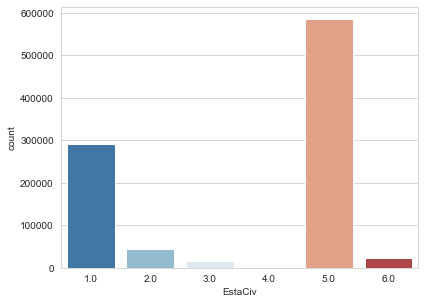

In [18]:
# EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO
sns.set_style('whitegrid')
sns.countplot(x='EstaCiv',data=data,palette='RdBu_r')

'''
#EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO
'''


'\n#EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO\n'

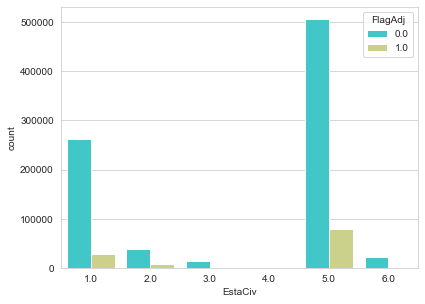

In [19]:
# Analisis de Estado civil vs Adjudicación de la Joya

sns.set_style('whitegrid')
sns.countplot(x='EstaCiv',hue='FlagAdj',data=data,palette='rainbow')


'''
#EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO
'''


'\nTipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA\n'

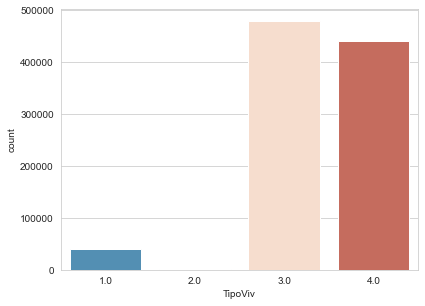

In [20]:
# TipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA
sns.set_style('whitegrid')
sns.countplot(x='TipoViv',data=data,palette='RdBu_r')

'''
TipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA
'''


'\nTipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA\n'

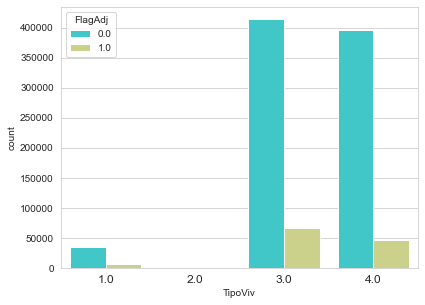

In [21]:
# Analisis de tipo de vivienda vs Adjudicación de la Joya

sns.set_style('whitegrid')
ax=sns.countplot(x='TipoViv',hue='FlagAdj',data=data,palette='rainbow')

plt.xticks(size=12)

'''
TipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA
'''


<AxesSubplot:xlabel='Sexo', ylabel='count'>

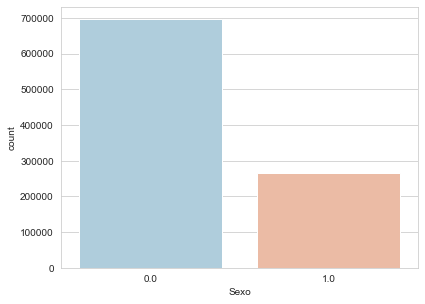

In [22]:
# Sexo 0: Mujer, 1: Hombre
sns.set_style('whitegrid')
sns.countplot(x='Sexo',data=data,palette='RdBu_r')

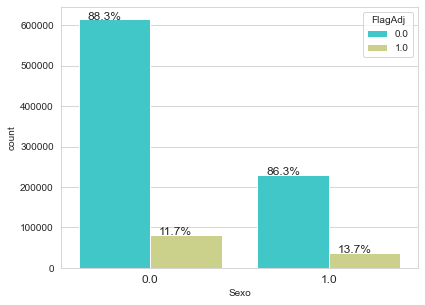

In [23]:
# Analisis Sexo vs Adjudicación de la Joya

sns.set_style('whitegrid')
ax= sns.countplot(x='Sexo',hue='FlagAdj',data=data,palette='rainbow')

'''
1: Hombre
0: Mujer
'''

plt.xticks(size=12)

with_hue(ax,data.Sexo,2,2)

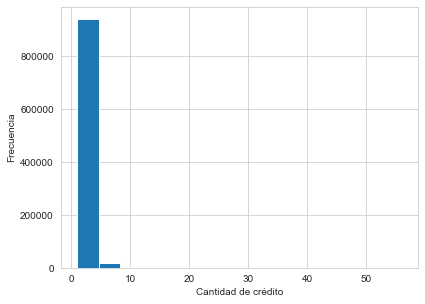

In [24]:
# Analizando la Cantidad de Credito (CantCred)

#sns.distplot(data['CantCred'].dropna(),kde=False,color='darkred',bins=80)

data['CantCred'].hist(bins=15) 
plt.xlabel("Cantidad de crédito")
plt.ylabel("Frecuencia")
plt.show()



<AxesSubplot:xlabel='CantCred'>

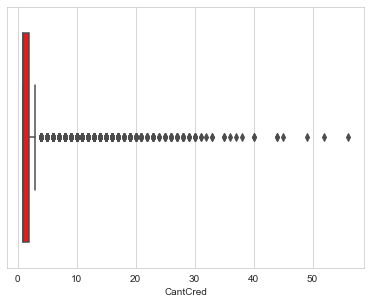

In [25]:
# Gráfico de caja:

sns.boxplot(x="CantCred",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")


In [26]:
 #Intervalo de cantidad de credito
import math

k = 1 + 3.322 * math.log10(len(data['CantCred']))
periodos = math.ceil(k)

inf = data['CantCred'].min()        # Limite inferior del primer intervalo
dif = data['CantCred'].max()
sup = data['CantCred'].max()        # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['CantCred'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[1.0, 3.75)",919008,2.375,1.00,3.75
"[3.75, 6.5)",35869,5.125,3.75,6.50
"[6.5, 9.25)",5216,7.875,6.50,9.25
"[9.25, 12.0)",1094,10.625,9.25,12.00
"[12.0, 14.75)",503,13.375,12.00,14.75
"[14.75, 17.5)",153,16.125,14.75,17.50
"[17.5, 20.25)",49,18.875,17.50,20.25
"[20.25, 23.0)",20,21.625,20.25,23.00
"[23.0, 25.75)",21,24.375,23.00,25.75


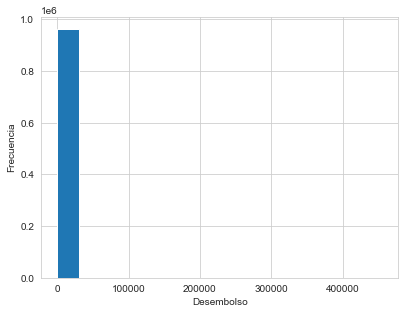

In [27]:
# Analizando el desembolso (Desem)

#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['Desem'].hist(bins=15) 
plt.xlabel("Desembolso")
plt.ylabel("Frecuencia")
plt.show()


<AxesSubplot:xlabel='Desem'>

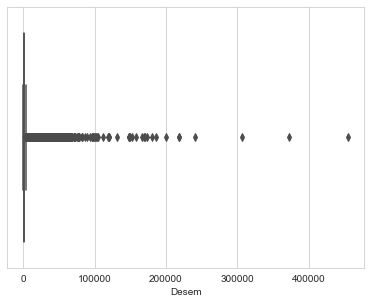

In [28]:
sns.boxplot(x="Desem",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [29]:
# Intervalo de Desem
import math

k = 1 + 3.322 * math.log10(len(data['Desem']))
periodos = math.ceil(k)

inf = data['Desem'].min()        # Limite inferior del primer intervalo
dif = data['Desem'].max()
sup = data['Desem'].max()        # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['Desem'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[0.0, 22760.902)",960982,11380.451,0.000,22760.902
"[22760.902, 45521.804)",824,34141.353,22760.902,45521.804
"[45521.804, 68282.70599999999)",125,56902.255,45521.804,68282.706
"[68282.70599999999, 91043.608)",19,79663.157,68282.706,91043.608
"[91043.608, 113804.51)",11,102424.059,91043.608,113804.510
"[113804.51, 136565.41199999998)",4,125184.961,113804.510,136565.412
"[136565.41199999998, 159326.31399999998)",6,147945.863,136565.412,159326.314
"[159326.31399999998, 182087.216)",5,170706.765,159326.314,182087.216
"[182087.216, 204848.118)",2,193467.667,182087.216,204848.118


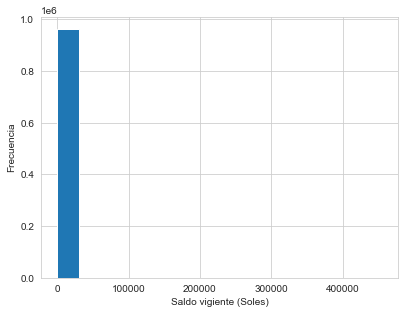

In [30]:
# Analizando el Saldo vigiente (SalVigSol)

#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['SalVigSol'].hist(bins=15) 
plt.xlabel("Saldo vigiente (Soles)")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='SalVigSol'>

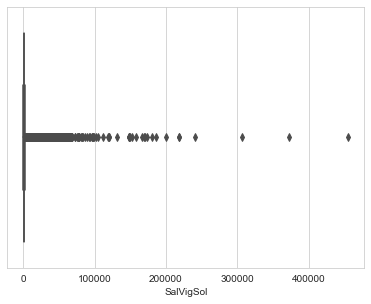

In [31]:
sns.boxplot(x="SalVigSol",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [32]:
# Intervalo de Saldo vigiente
import math


k = 1 + 3.322 * math.log10(len(data['SalVigSol']))
periodos = math.ceil(k)

inf = data['SalVigSol'].min()        # Limite inferior del primer intervalo
dif = data['SalVigSol'].max()
sup = data['SalVigSol'].max()   # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['SalVigSol'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[0.0, 22760.902)",961161,11380.451,0.000,22760.902
"[22760.902, 45521.804)",673,34141.353,22760.902,45521.804
"[45521.804, 68282.70599999999)",101,56902.255,45521.804,68282.706
"[68282.70599999999, 91043.608)",16,79663.157,68282.706,91043.608
"[91043.608, 113804.51)",10,102424.059,91043.608,113804.510
"[113804.51, 136565.41199999998)",4,125184.961,113804.510,136565.412
"[136565.41199999998, 159326.31399999998)",6,147945.863,136565.412,159326.314
"[159326.31399999998, 182087.216)",5,170706.765,159326.314,182087.216
"[182087.216, 204848.118)",2,193467.667,182087.216,204848.118


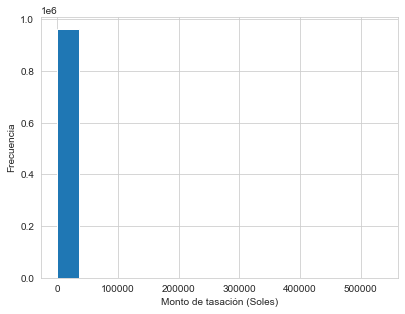

In [33]:
# Analizando el Monto de tasación
#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['Monto_Tasación'].hist(bins=15) 
plt.xlabel("Monto de tasación (Soles)")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='Monto_Tasación'>

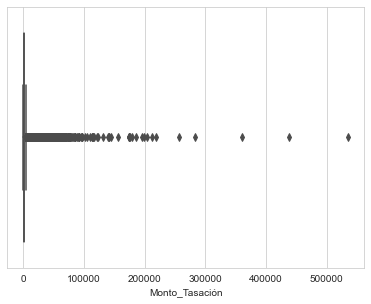

In [34]:
sns.boxplot(x="Monto_Tasación",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [35]:
# Intervalo de monto de tasación
import math


k = 1 + 3.322 * math.log10(len(data['Monto_Tasación']))
periodos = math.ceil(k)

inf = data['Monto_Tasación'].min()       # Limite inferior del primer intervalo
dif = data['Monto_Tasación'].max()
sup = data['Monto_Tasación'].max()    # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['Monto_Tasación'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[48.6, 26823.809999999998)",961192,13436.205,48.60,26823.81
"[26823.809999999998, 53599.02)",651,40211.415,26823.81,53599.02
"[53599.02, 80374.23000000001)",91,66986.625,53599.02,80374.23
"[80374.23000000001, 107149.44)",20,93761.835,80374.23,107149.44
"[107149.44, 133924.65)",9,120537.045,107149.44,133924.65
"[133924.65, 160699.86000000002)",5,147312.255,133924.65,160699.86
"[160699.86000000002, 187475.07)",6,174087.465,160699.86,187475.07
"[187475.07, 214250.28)",4,200862.675,187475.07,214250.28
"[214250.28, 241025.49)",1,227637.885,214250.28,241025.49


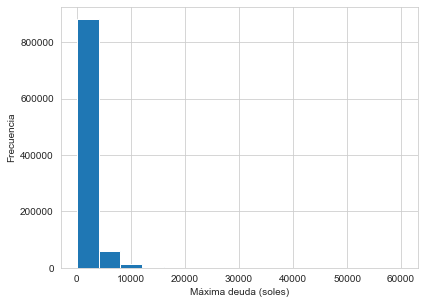

In [36]:
# Analizando maxima deunda
#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['MaxDeuda'].hist(bins=15) 
plt.xlabel("Máxima deuda (soles)")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='MaxDeuda'>

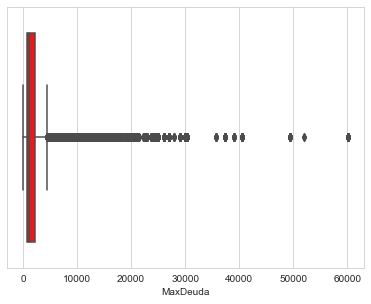

In [37]:
sns.boxplot(x="MaxDeuda",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [38]:
# Intervalo de maxima deuda
import math


k = 1 + 3.322 * math.log10(len(data['MaxDeuda']))
periodos = math.ceil(k)

inf = data['MaxDeuda'].min()       # Limite inferior del primer intervalo
dif = data['MaxDeuda'].max()
sup = data['MaxDeuda'].max()    # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['MaxDeuda'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[50.0, 3053.525)",826670,1551.7625,50.000,3053.525
"[3053.525, 6057.05)",97520,4555.2875,3053.525,6057.050
"[6057.05, 9060.575)",20301,7558.8125,6057.050,9060.575
"[9060.575, 12064.1)",10602,10562.3375,9060.575,12064.100
"[12064.1, 15067.625)",4052,13565.8625,12064.100,15067.625
"[15067.625, 18071.15)",1065,16569.3875,15067.625,18071.150
"[18071.15, 21074.675)",523,19572.9125,18071.150,21074.675
"[21074.675, 24078.2)",235,22576.4375,21074.675,24078.200
"[24078.2, 27081.725000000002)",521,25579.9625,24078.200,27081.725


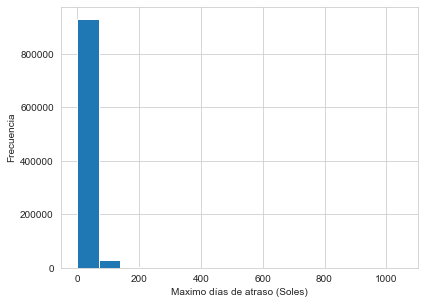

In [39]:
# Analizando maximo dias de atraso
#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['MaxDiasAtra'].hist(bins=15) 
plt.xlabel("Maximo días de atraso (Soles)")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='MaxDiasAtra'>

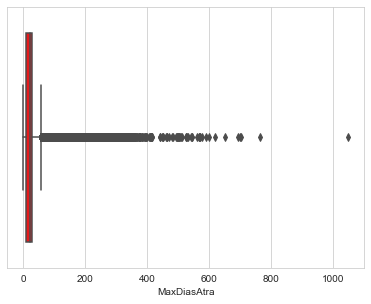

In [40]:
sns.boxplot(x="MaxDiasAtra",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [41]:
# Intervalo de maxima dias de atraso
import math


k = 1 + 3.322 * math.log10(len(data['MaxDiasAtra']))
periodos = math.ceil(k)

inf = data['MaxDiasAtra'].min()       # Limite inferior del primer intervalo
dif = data['MaxDiasAtra'].max()
sup = data['MaxDiasAtra'].max()      # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['MaxDiasAtra'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[0.0, 52.5)",893221,26.25,0.0,52.5
"[52.5, 105.0)",58205,78.75,52.5,105.0
"[105.0, 157.5)",8016,131.25,105.0,157.5
"[157.5, 210.0)",1676,183.75,157.5,210.0
"[210.0, 262.5)",525,236.25,210.0,262.5
"[262.5, 315.0)",176,288.75,262.5,315.0
"[315.0, 367.5)",90,341.25,315.0,367.5
"[367.5, 420.0)",32,393.75,367.5,420.0
"[420.0, 472.5)",9,446.25,420.0,472.5


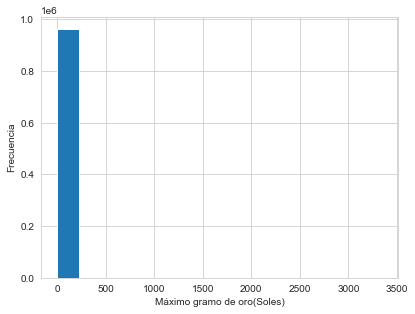

In [42]:
# Analizando maximo gramo de oro
#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['MaxGramOro'].hist(bins=15) 
plt.xlabel("Máximo gramo de oro(Soles)")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='MaxGramOro'>

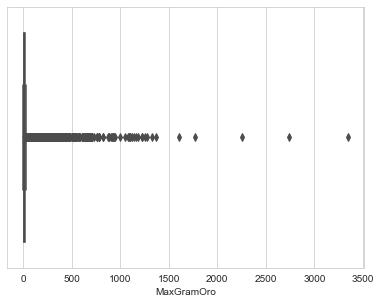

In [43]:
sns.boxplot(x="MaxGramOro",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [44]:
# Intervalo de maxima dias de atraso
import math


k = 1 + 3.322 * math.log10(len(data['MaxGramOro']))
periodos = math.ceil(k)

inf = data['MaxGramOro'].min()       # Limite inferior del primer intervalo
dif = data['MaxGramOro'].max()
sup = data['MaxGramOro'].max()     # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['MaxGramOro'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[0.45, 167.78775000000002)",960732,84.118875,0.45000,167.78775
"[167.78775000000002, 335.12550000000005)",1046,251.456625,167.78775,335.12550
"[335.12550000000005, 502.4632500000001)",95,418.794375,335.12550,502.46325
"[502.4632500000001, 669.8010000000002)",48,586.132125,502.46325,669.80100
"[669.8010000000002, 837.1387500000002)",28,753.469875,669.80100,837.13875
"[837.1387500000002, 1004.4765000000002)",14,920.807625,837.13875,1004.47650
"[1004.4765000000002, 1171.8142500000001)",9,1088.145375,1004.47650,1171.81425
"[1171.8142500000001, 1339.1520000000003)",6,1255.483125,1171.81425,1339.15200
"[1339.1520000000003, 1506.4897500000004)",1,1422.820875,1339.15200,1506.48975


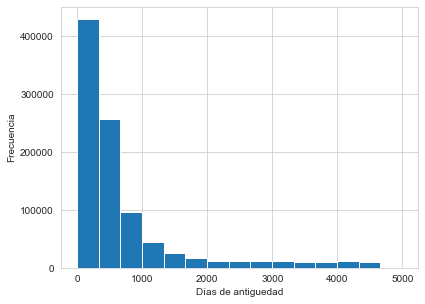

In [45]:
# Analizando días de antiguedad

data['AntiDias'].hist(bins=15) 
plt.xlabel("Días de antiguedad")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='AntiDias'>

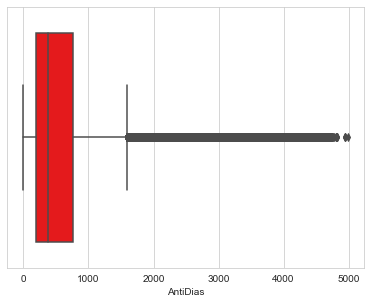

In [46]:
sns.boxplot(x="AntiDias",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [47]:
# Intervalo de maxima dias de antiguedad
import math


k = 1 + 3.322 * math.log10(len(data['AntiDias']))
periodos = math.ceil(k)

inf = data['AntiDias'].min()        # Limite inferior del primer intervalo
dif = data['AntiDias'].max()
sup = data['AntiDias'].max()  # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['AntiDias'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[0.0, 249.55)",314703,124.775,0.00,249.55
"[249.55, 499.1)",280165,374.325,249.55,499.10
"[499.1, 748.6500000000001)",123458,623.875,499.10,748.65
"[748.6500000000001, 998.2)",63692,873.425,748.65,998.20
"[998.2, 1247.75)",35497,1122.975,998.20,1247.75
"[1247.75, 1497.3000000000002)",22935,1372.525,1247.75,1497.30
"[1497.3000000000002, 1746.8500000000001)",16697,1622.075,1497.30,1746.85
"[1746.8500000000001, 1996.4)",12371,1871.625,1746.85,1996.40
"[1996.4, 2245.9500000000003)",10407,2121.175,1996.40,2245.95


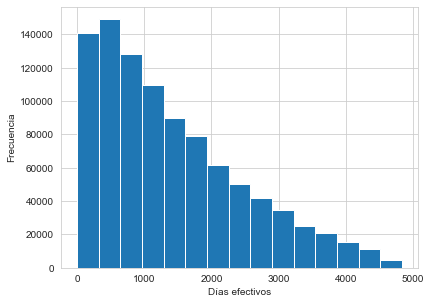

In [48]:
# Analizando días efectivos
#sns.distplot(data['Desem'].dropna(),kde=False,color='darkred',bins=25)

data['DiasEfec'].hist(bins=15) 
plt.xlabel("Días efectivos")
plt.ylabel("Frecuencia")
plt.show()

<AxesSubplot:xlabel='DiasEfec'>

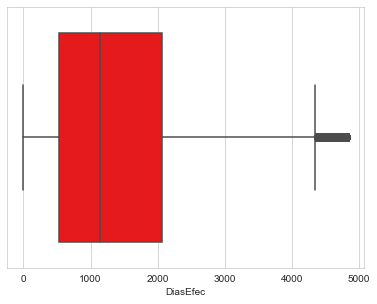

In [49]:
sns.boxplot(x="DiasEfec",data=data,saturation=1.2,width=0.8,fliersize=5,palette="Set1")

In [50]:
# Intervalo de maxima dias efectivos
import math


k = 1 + 3.322 * math.log10(len(data['DiasEfec']))
periodos = math.ceil(k)

inf = data['DiasEfec'].min()        # Limite inferior del primer intervalo
dif = data['DiasEfec'].max()
sup = data['DiasEfec'].max()  # Limite superior del último intervalo

intervals = pd.interval_range(
    start=inf,
    end=sup,
    periods=k,
    name="Intervalo",
    closed="left")

df = pd.DataFrame(index=intervals)
df['FreqAbs'] = pd.cut(data['DiasEfec'], bins=df.index).value_counts()
df['Marca']  = df.index.mid

df['LimInf'] = df.index.left
df['LimSup'] = df.index.right
df

,FreqAbs,Marca,LimInf,LimSup
Intervalo,,,,
"[1.0, 242.65)",102633,121.825,1.00,242.65
"[242.65, 484.3)",116798,363.475,242.65,484.30
"[484.3, 725.95)",103662,605.125,484.30,725.95
"[725.95, 967.6)",94839,846.775,725.95,967.60
"[967.6, 1209.25)",83476,1088.425,967.60,1209.25
"[1209.25, 1450.9)",73045,1330.075,1209.25,1450.90
"[1450.9, 1692.55)",63801,1571.725,1450.90,1692.55
"[1692.55, 1934.2)",58203,1813.375,1692.55,1934.20
"[1934.2, 2175.85)",48065,2055.025,1934.20,2175.85


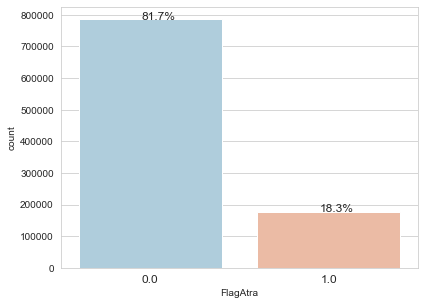

In [51]:
# Flag de atrasos

sns.set_style('whitegrid')
ax=sns.countplot(x='FlagAtra',data=data,palette='RdBu_r')

plt.xticks(size=12)

without_hue(ax,data.FlagAtra)

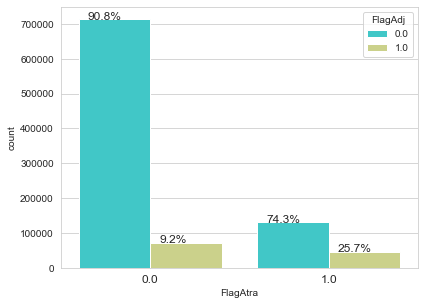

In [52]:
# Flag de atrasos vs flag de adjudicación

sns.set_style('whitegrid')
ax= sns.countplot(x='FlagAtra',hue='FlagAdj',data=data,palette='rainbow')

plt.xticks(size=12)

with_hue(ax,data.FlagAtra,2,2)

In [53]:
# Analizaremos el ratio de desembolso:

# No se debería de desembolsar mas del monto de tasación, es una regla de la Caja de creditos prendarios.

data['ratio_desem_tasa'] = data['Desem']/data['Monto_Tasación']

# data.describe().T.apply(lambda s: s.apply('{0:.2f}'.format))  ## describe las variables

C:\Users\Mauro\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ratio_desem_tasa'>

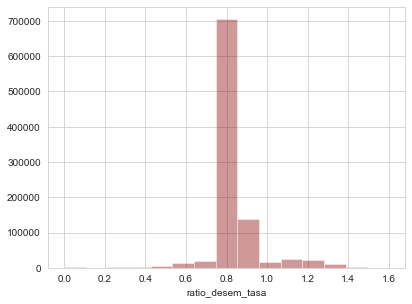

In [54]:
sns.distplot(data['ratio_desem_tasa'].dropna(),kde=False,color='darkred',bins=15)

Luego de analizar la data graficamente y con algunos indicadores, se evidencia incosistencia en los datos y datos atipos.

## 2. Transformando los datos



- *De la visulizaciín grafica y la revisión de las varaibles, se ha identificado datos atipicos den la base, por lo que se procedera a eliminarlos.*

    Las etiqueta de las variables son las siguientes:

    - Sexo 0: Mujer, 1: Hombre
    - EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO
    - TipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA
    - FlagAdj 0: Pagó a tiempo y la caja no se adjudico el bien prendario, 1: La caja de adjudicó el bien prendario


In [55]:
#Eliminar los casos con Edad menor a 18 años:
data = data[data.Edad >= 18]

In [56]:
#Eliminar los casos con desembolso=0:
data = data[data.Desem > 0]

In [57]:
#Estableciendo un umbral al ratio de desembolso y tasación, en clase el profesor
#Chincaro nos indicó 0.99 para no eliminar mucha información
#data['ratio_desem_tasa'] = data['Desem']/data['Monto_Tasación']
data = data[data.ratio_desem_tasa <= 0.99]

In [58]:
#Editando variables de tiempo
data['t_Periodo'] = pd.to_datetime(data['Periodo'], format='%Y%m')

In [59]:
#Eliminando variables de no interés
del data['ratio_desem_tasa'],data['FlagAtra'],data['Periodo']

#data['t_Periodo'], data['CodCli'], data['FechAnalisis']

In [60]:
data.describe().T.apply(lambda s: s.apply('{0:.2f}'.format))  ## describe las variables

,count,mean,std,min,25%,50%,75%,max
CodCli,887455.00,1090319543962.72,473506820.08,1090100000043.00,1090100334341.00,1090100817058.00,1090400011371.00,1094200000159.00
Edad,887455.00,49.54,13.98,19.00,38.00,49.00,60.00,121.00
Sexo,887455.00,0.28,0.45,0.00,0.00,0.00,1.00,1.00
EstaCiv,887455.00,3.63,1.87,1.00,1.00,5.00,5.00,6.00
TipoViv,887455.00,3.37,0.70,1.00,3.00,3.00,4.00,4.00
CantCred,887455.00,1.45,1.09,1.00,1.00,1.00,2.00,56.00
Desem,887455.00,1265.23,2118.05,40.00,397.09,740.00,1437.43,455218.04
SalVigSol,887455.00,1090.63,1986.77,0.00,313.67,606.28,1224.00,455218.04
Monto_Tasación,887455.00,1522.69,2536.81,48.60,470.00,886.20,1725.50,535552.80
DiasEfec,887455.00,1450.50,1092.69,1.00,562.00,1188.00,2114.00,4834.00


In [61]:
#Dicotomizando
#EstaCiv 1:CASADO, 2: CONVIVIENTE, 3: DIVORCIADO, 4: SEPARADO, 5: SOLTERO, 6: VIUDO
data['EstaCiv_cas'] = data['EstaCiv']
data['EstaCiv_con'] = data['EstaCiv']
data['EstaCiv_div'] = data['EstaCiv']
data['EstaCiv_sep'] = data['EstaCiv']
data['EstaCiv_sol'] = data['EstaCiv']
data.replace(to_replace={"EstaCiv_cas": {2:0,3:0,4:0,5:0,6:0},"EstaCiv_con": {1:0,2:1,3:0,4:0,5:0,6:0},"EstaCiv_div": {1:0,2:0,3:1,4:0,5:0,6:0},"EstaCiv_sep": {1:0,2:0,3:0,4:1,5:0,6:0},"EstaCiv_sol": {1:0,2:0,3:0,4:0,5:1,6:0}},inplace=True)

#TipoViv 1:ALQUILADA, 2: ALQUILER VENTA, 3: DE FAMILIA, 4: PROPIA
data['TipoViv_alq'] = data['TipoViv']
data['TipoViv_def'] = data['TipoViv']
data['TipoViv_pro'] = data['TipoViv']
data.replace(to_replace={"TipoViv_alq": {2:0,3:0,4:0},"TipoViv_def": {1:0,2:0,3:1,4:0},"TipoViv_pro": {1:0,2:0,3:0,4:1}},inplace=True)

#Eliminando variables de no interés
del data['EstaCiv'],data['TipoViv']

In [62]:
data.head()

,CodCli,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,...,FlagAdj,t_Periodo,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
0,1.090300e+12,69.0,1.0,2.0,2613.74,2549.54,2736.90,551.0,2690.89,6.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1.090300e+12,55.0,0.0,2.0,2782.07,1488.64,3051.00,1327.0,1790.80,33.0,...,0.0,2007-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,1.090300e+12,55.0,0.0,1.0,1407.21,1205.06,1473.52,1645.0,4315.00,28.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.090300e+12,61.0,0.0,2.0,658.70,429.95,1095.28,424.0,399.62,28.0,...,1.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.090300e+12,59.0,0.0,2.0,2162.62,2148.78,2264.52,1213.0,1642.20,46.0,...,0.0,2007-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [63]:
# Nos quedaremos con los ultimos registros de cada cliente, con el fin de contar con un único registro por cliente.
#data_last=data.drop_duplicates(subset=['CodCli'], keep='last')

In [64]:
data.head(100)

,CodCli,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,...,FlagAdj,t_Periodo,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
0,1.090300e+12,69.0,1.0,2.0,2613.74,2549.54,2736.90,551.0,2690.89,6.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1.090300e+12,55.0,0.0,2.0,2782.07,1488.64,3051.00,1327.0,1790.80,33.0,...,0.0,2007-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,1.090300e+12,55.0,0.0,1.0,1407.21,1205.06,1473.52,1645.0,4315.00,28.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.090300e+12,61.0,0.0,2.0,658.70,429.95,1095.28,424.0,399.62,28.0,...,1.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.090300e+12,59.0,0.0,2.0,2162.62,2148.78,2264.52,1213.0,1642.20,46.0,...,0.0,2007-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,1.090300e+12,63.0,1.0,1.0,359.16,354.35,376.08,1208.0,1380.05,27.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
98,1.090300e+12,55.0,0.0,1.0,386.48,385.01,404.69,397.0,2632.00,13.0,...,0.0,2007-05-01,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
99,1.090300e+12,55.0,1.0,2.0,638.85,434.23,668.96,576.0,664.70,10.0,...,0.0,2007-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
100,1.090300e+12,56.0,0.0,1.0,967.56,592.41,1013.15,3021.0,3175.00,20.0,...,0.0,2007-05-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [65]:
data.describe().T.apply(lambda s: s.apply('{0:.2f}'.format))  ## describe las variables

,count,mean,std,min,25%,50%,75%,max
CodCli,887455.00,1090319543962.72,473506820.08,1090100000043.00,1090100334341.00,1090100817058.00,1090400011371.00,1094200000159.00
Edad,887455.00,49.54,13.98,19.00,38.00,49.00,60.00,121.00
Sexo,887455.00,0.28,0.45,0.00,0.00,0.00,1.00,1.00
CantCred,887455.00,1.45,1.09,1.00,1.00,1.00,2.00,56.00
Desem,887455.00,1265.23,2118.05,40.00,397.09,740.00,1437.43,455218.04
SalVigSol,887455.00,1090.63,1986.77,0.00,313.67,606.28,1224.00,455218.04
Monto_Tasación,887455.00,1522.69,2536.81,48.60,470.00,886.20,1725.50,535552.80
DiasEfec,887455.00,1450.50,1092.69,1.00,562.00,1188.00,2114.00,4834.00
MaxDeuda,887455.00,1759.71,2224.84,50.00,604.50,1122.00,2071.00,60120.50
MaxDiasAtra,887455.00,22.64,21.76,0.00,9.00,19.00,28.00,1050.00


In [66]:
#Correlación de variables:
#data.corr()

corr = data.corr()
corr.style.background_gradient (cmap = 'coolwarm')


,CodCli,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,FechAnalisis,AntiDias,FlagAdj,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
CodCli,1.000000,-0.193309,0.021868,-0.069499,-0.010628,-0.004195,-0.006810,-0.190736,-0.021900,-0.054712,-0.040247,0.153132,-0.021483,0.018311,-0.065419,-0.026084,-0.017936,0.000400,0.092139,0.100000,-0.015439,-0.025428
Edad,-0.193309,1.000000,-0.009800,0.068282,0.043768,0.027815,0.041691,0.304417,0.032490,0.063477,0.077978,-0.167477,-0.011891,-0.080243,0.369137,0.010520,0.084594,0.033093,-0.442556,-0.056530,-0.253433,0.278281
Sexo,0.021868,-0.009800,1.000000,-0.055362,0.002540,0.007596,0.005250,-0.159692,-0.023524,-0.042376,0.001595,0.014200,0.007139,0.025325,0.001356,0.024086,-0.026934,-0.008148,0.019352,0.023632,0.038119,-0.048538
CantCred,-0.069499,0.068282,-0.055362,1.000000,0.454548,0.449332,0.448217,0.266886,0.153884,0.767012,0.488021,-0.049239,0.032982,-0.008810,0.039775,-0.001766,0.010981,0.004739,-0.047070,-0.024267,0.003199,0.006493
Desem,-0.010628,0.043768,0.002540,0.454548,1.000000,0.977218,0.994830,0.102698,0.533263,0.342925,0.935802,0.061357,-0.010728,-0.007085,0.024581,-0.012373,0.024252,0.003598,-0.027659,-0.003000,-0.026433,0.027775
SalVigSol,-0.004195,0.027815,0.007596,0.449332,0.977218,1.000000,0.970087,0.073032,0.497690,0.335356,0.914141,0.058712,0.000447,0.015643,0.015521,-0.009826,0.019798,0.003143,-0.017307,0.000511,-0.021057,0.020929
Monto_Tasación,-0.006810,0.041691,0.005250,0.448217,0.994830,0.970087,1.000000,0.103670,0.535453,0.338587,0.926483,0.076372,-0.015247,-0.009720,0.024504,-0.013357,0.024077,0.002715,-0.027182,-0.002414,-0.026820,0.027933
DiasEfec,-0.190736,0.304417,-0.159692,0.266886,0.102698,0.073032,0.103670,1.000000,0.175271,0.220435,0.100882,-0.072930,-0.073143,-0.242752,0.147305,-0.021161,0.031573,0.009397,-0.163288,-0.080277,-0.085068,0.119276
MaxDeuda,-0.021900,0.032490,-0.023524,0.153884,0.533263,0.497690,0.535453,0.175271,1.000000,0.119759,0.528483,-0.019807,-0.101122,-0.080491,0.025457,-0.018139,0.033850,-0.000014,-0.031148,-0.002601,-0.054043,0.055489
MaxDiasAtra,-0.054712,0.063477,-0.042376,0.767012,0.342925,0.335356,0.338587,0.220435,0.119759,1.000000,0.366238,-0.034339,0.023808,-0.013418,0.037371,-0.001116,0.008174,0.002219,-0.043375,-0.020693,0.001710,0.006512


In [67]:
#Se esta elimnando las variables de "Dese, 'Monto_Tasación' por ener una alta correlación
data_2=data.drop(['Desem','Monto_Tasación'],axis=1)

In [68]:
corr = data_2.corr()
corr.style.background_gradient (cmap = 'coolwarm')

,CodCli,Edad,Sexo,CantCred,SalVigSol,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,FechAnalisis,AntiDias,FlagAdj,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
CodCli,1.000000,-0.193309,0.021868,-0.069499,-0.004195,-0.190736,-0.021900,-0.054712,-0.040247,0.153132,-0.021483,0.018311,-0.065419,-0.026084,-0.017936,0.000400,0.092139,0.100000,-0.015439,-0.025428
Edad,-0.193309,1.000000,-0.009800,0.068282,0.027815,0.304417,0.032490,0.063477,0.077978,-0.167477,-0.011891,-0.080243,0.369137,0.010520,0.084594,0.033093,-0.442556,-0.056530,-0.253433,0.278281
Sexo,0.021868,-0.009800,1.000000,-0.055362,0.007596,-0.159692,-0.023524,-0.042376,0.001595,0.014200,0.007139,0.025325,0.001356,0.024086,-0.026934,-0.008148,0.019352,0.023632,0.038119,-0.048538
CantCred,-0.069499,0.068282,-0.055362,1.000000,0.449332,0.266886,0.153884,0.767012,0.488021,-0.049239,0.032982,-0.008810,0.039775,-0.001766,0.010981,0.004739,-0.047070,-0.024267,0.003199,0.006493
SalVigSol,-0.004195,0.027815,0.007596,0.449332,1.000000,0.073032,0.497690,0.335356,0.914141,0.058712,0.000447,0.015643,0.015521,-0.009826,0.019798,0.003143,-0.017307,0.000511,-0.021057,0.020929
DiasEfec,-0.190736,0.304417,-0.159692,0.266886,0.073032,1.000000,0.175271,0.220435,0.100882,-0.072930,-0.073143,-0.242752,0.147305,-0.021161,0.031573,0.009397,-0.163288,-0.080277,-0.085068,0.119276
MaxDeuda,-0.021900,0.032490,-0.023524,0.153884,0.497690,0.175271,1.000000,0.119759,0.528483,-0.019807,-0.101122,-0.080491,0.025457,-0.018139,0.033850,-0.000014,-0.031148,-0.002601,-0.054043,0.055489
MaxDiasAtra,-0.054712,0.063477,-0.042376,0.767012,0.335356,0.220435,0.119759,1.000000,0.366238,-0.034339,0.023808,-0.013418,0.037371,-0.001116,0.008174,0.002219,-0.043375,-0.020693,0.001710,0.006512
MaxGramOro,-0.040247,0.077978,0.001595,0.488021,0.914141,0.100882,0.528483,0.366238,1.000000,-0.064108,0.000740,-0.009384,0.033649,-0.008548,0.027341,0.004023,-0.041256,-0.010013,-0.029291,0.033328
FechAnalisis,0.153132,-0.167477,0.014200,-0.049239,0.058712,-0.072930,-0.019807,-0.034339,-0.064108,1.000000,0.552491,0.480925,-0.054259,-0.012706,-0.019703,-0.008624,0.071822,0.035516,0.049065,-0.063479


In [69]:
# La correlacion persisite, y se decide eliminar la varaible "MaxGramOro"
data_3=data_2.drop(['MaxGramOro'],axis=1) 

In [70]:
corr = data_3.corr()
corr.style.background_gradient (cmap = 'coolwarm')

,CodCli,Edad,Sexo,CantCred,SalVigSol,DiasEfec,MaxDeuda,MaxDiasAtra,FechAnalisis,AntiDias,FlagAdj,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
CodCli,1.000000,-0.193309,0.021868,-0.069499,-0.004195,-0.190736,-0.021900,-0.054712,0.153132,-0.021483,0.018311,-0.065419,-0.026084,-0.017936,0.000400,0.092139,0.100000,-0.015439,-0.025428
Edad,-0.193309,1.000000,-0.009800,0.068282,0.027815,0.304417,0.032490,0.063477,-0.167477,-0.011891,-0.080243,0.369137,0.010520,0.084594,0.033093,-0.442556,-0.056530,-0.253433,0.278281
Sexo,0.021868,-0.009800,1.000000,-0.055362,0.007596,-0.159692,-0.023524,-0.042376,0.014200,0.007139,0.025325,0.001356,0.024086,-0.026934,-0.008148,0.019352,0.023632,0.038119,-0.048538
CantCred,-0.069499,0.068282,-0.055362,1.000000,0.449332,0.266886,0.153884,0.767012,-0.049239,0.032982,-0.008810,0.039775,-0.001766,0.010981,0.004739,-0.047070,-0.024267,0.003199,0.006493
SalVigSol,-0.004195,0.027815,0.007596,0.449332,1.000000,0.073032,0.497690,0.335356,0.058712,0.000447,0.015643,0.015521,-0.009826,0.019798,0.003143,-0.017307,0.000511,-0.021057,0.020929
DiasEfec,-0.190736,0.304417,-0.159692,0.266886,0.073032,1.000000,0.175271,0.220435,-0.072930,-0.073143,-0.242752,0.147305,-0.021161,0.031573,0.009397,-0.163288,-0.080277,-0.085068,0.119276
MaxDeuda,-0.021900,0.032490,-0.023524,0.153884,0.497690,0.175271,1.000000,0.119759,-0.019807,-0.101122,-0.080491,0.025457,-0.018139,0.033850,-0.000014,-0.031148,-0.002601,-0.054043,0.055489
MaxDiasAtra,-0.054712,0.063477,-0.042376,0.767012,0.335356,0.220435,0.119759,1.000000,-0.034339,0.023808,-0.013418,0.037371,-0.001116,0.008174,0.002219,-0.043375,-0.020693,0.001710,0.006512
FechAnalisis,0.153132,-0.167477,0.014200,-0.049239,0.058712,-0.072930,-0.019807,-0.034339,1.000000,0.552491,0.480925,-0.054259,-0.012706,-0.019703,-0.008624,0.071822,0.035516,0.049065,-0.063479
AntiDias,-0.021483,-0.011891,0.007139,0.032982,0.000447,-0.073143,-0.101122,0.023808,0.552491,1.000000,0.733022,-0.020890,0.021772,-0.024737,0.007590,0.021098,0.014439,0.032126,-0.038186


In [71]:
data['Rango_antiguedad']=pd.cut(data.AntiDias,bins=[0,1000,2000,3000,4000,5000])

In [72]:
pd.crosstab(data['Rango_antiguedad'], data['FlagAdj']).stack().reset_index(name='Freq')

,Rango_antiguedad,FlagAdj,Freq
0,"(0, 1000]",0.0,690651
1,"(0, 1000]",1.0,17773
2,"(1000, 2000]",0.0,67539
3,"(1000, 2000]",1.0,19376
4,"(2000, 3000]",0.0,12522
5,"(2000, 3000]",1.0,23411
6,"(3000, 4000]",0.0,2635
7,"(3000, 4000]",1.0,30302
8,"(4000, 5000]",0.0,1461
9,"(4000, 5000]",1.0,21782


In [73]:
data.groupby(['Rango_antiguedad', 'FlagAdj']).FlagAdj.count().unstack().fillna(0)

FlagAdj,0.0,1.0
Rango_antiguedad,,
"(0, 1000]",690651,17773
"(1000, 2000]",67539,19376
"(2000, 3000]",12522,23411
"(3000, 4000]",2635,30302
"(4000, 5000]",1461,21782


### Debido a la alta correlacion en tre las variables "MaxGramOro", "Monto_Tasación","Desem"

In [74]:
# stratified split dataset by column
from sklearn.model_selection import train_test_split #Nos permite partir la data
data_aleatorio, data_drop_aletorio = train_test_split(data, train_size =0.02, stratify=data['t_Periodo'])

In [75]:
data_aleatorio.describe().T.apply(lambda s: s.apply('{0:.2f}'.format))  ## describe las variables

,count,mean,std,min,25%,50%,75%,max
CodCli,17749.00,1090317377816.37,469315748.30,1090100000311.00,1090100329771.00,1090100814571.00,1090400008249.00,1094000021547.00
Edad,17749.00,49.44,13.96,20.00,38.00,49.00,59.00,119.00
Sexo,17749.00,0.28,0.45,0.00,0.00,0.00,1.00,1.00
CantCred,17749.00,1.46,1.12,1.00,1.00,1.00,2.00,32.00
Desem,17749.00,1290.69,2021.80,53.76,397.09,748.00,1474.05,85777.60
SalVigSol,17749.00,1115.40,1850.62,3.55,315.37,613.96,1250.13,85777.60
Monto_Tasación,17749.00,1551.57,2423.19,65.34,469.80,897.00,1764.90,100920.40
DiasEfec,17749.00,1444.77,1090.04,2.00,556.00,1186.00,2104.00,4834.00
MaxDeuda,17749.00,1798.43,2312.22,66.27,608.53,1133.05,2103.75,60120.50
MaxDiasAtra,17749.00,22.68,22.11,0.00,9.00,20.00,28.00,700.00


In [76]:
column_names = ["CodCli","Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec", "MaxDeuda","MaxDiasAtra","MaxGramOro","FechAnalisis","AntiDias","FlagAdj", "t_Periodo","EstaCiv_cas","EstaCiv_con","EstaCiv_div","EstaCiv_sep","EstaCiv_sol", "TipoViv_alq","TipoViv_def","TipoViv_pro"] 

In [77]:
## generamos un array con las variables
array_data_aleatorio = np.array(data_aleatorio[column_names])

In [78]:
array_data_aleatorio

array([[1090400208043.0, 38.0, 1.0, ..., 0.0, 0.0, 1.0],
       [1090101024353.0, 32.0, 0.0, ..., 0.0, 1.0, 0.0],
       [1090100673811.0, 39.0, 0.0, ..., 0.0, 1.0, 0.0],
       ...,
       [1090100174092.0, 58.0, 0.0, ..., 1.0, 0.0, 0.0],
       [1090100192899.0, 60.0, 0.0, ..., 0.0, 0.0, 1.0],
       [1090100649392.0, 38.0, 0.0, ..., 0.0, 1.0, 0.0]], dtype=object)

In [79]:
data_aleatorio_df=pd.DataFrame(array_data_aleatorio,columns=column_names) 
data_aleatorio_df

,CodCli,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,...,FlagAdj,t_Periodo,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
0,1090400208043.0,38.0,1.0,1.0,11850.0,11850.0,14819.0,202.0,11850.0,13.0,...,0.0,2016-05-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,1090101024353.0,32.0,0.0,1.0,557.18,557.18,655.5,177.0,900.04,3.0,...,0.0,2008-08-01,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1090100673811.0,39.0,0.0,2.0,375.54,375.46,393.24,2655.0,646.5,12.0,...,0.0,2007-09-01,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1090101173812.0,44.0,1.0,1.0,382.19,377.35,450.0,550.0,1206.85,0.0,...,0.0,2011-09-01,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1090100557021.0,59.0,1.0,1.0,1100.12,1099.91,1294.26,2211.0,11244.55,23.0,...,0.0,2014-03-01,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17744,1090100159778.0,60.0,0.0,1.0,172.66,170.02,180.8,707.0,240.0,28.0,...,0.0,2008-05-01,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
17745,1090100285269.0,51.0,0.0,1.0,500.03,253.83,606.0,1599.0,500.03,21.0,...,0.0,2012-04-01,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
17746,1090100174092.0,58.0,0.0,1.0,355.3,354.52,418.0,2852.0,355.3,23.0,...,0.0,2012-03-01,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
17747,1090100192899.0,60.0,0.0,2.0,955.0,538.69,1127.4,4198.0,927.55,52.0,...,0.0,2014-01-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [80]:
data_aleatorio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CodCli          17749 non-null  object        
 1   Edad            17749 non-null  object        
 2   Sexo            17749 non-null  object        
 3   CantCred        17749 non-null  object        
 4   Desem           17749 non-null  object        
 5   SalVigSol       17749 non-null  object        
 6   Monto_Tasación  17749 non-null  object        
 7   DiasEfec        17749 non-null  object        
 8   MaxDeuda        17749 non-null  object        
 9   MaxDiasAtra     17749 non-null  object        
 10  MaxGramOro      17749 non-null  object        
 11  FechAnalisis    17749 non-null  object        
 12  AntiDias        17749 non-null  object        
 13  FlagAdj         17749 non-null  object        
 14  t_Periodo       17749 non-null  datetime64[ns]
 15  Es

In [81]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 887455 entries, 0 to 961980
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   CodCli            887455 non-null  float64       
 1   Edad              887455 non-null  float64       
 2   Sexo              887455 non-null  float64       
 3   CantCred          887455 non-null  float64       
 4   Desem             887455 non-null  float64       
 5   SalVigSol         887455 non-null  float64       
 6   Monto_Tasación    887455 non-null  float64       
 7   DiasEfec          887455 non-null  float64       
 8   MaxDeuda          887455 non-null  float64       
 9   MaxDiasAtra       887455 non-null  float64       
 10  MaxGramOro        887455 non-null  float64       
 11  FechAnalisis      887455 non-null  float64       
 12  AntiDias          887455 non-null  float64       
 13  FlagAdj           887455 non-null  float64       
 14  t_Pe

In [82]:
cols = data_aleatorio_df.select_dtypes(exclude=['datetime64[ns]']).columns

data_aleatorio_df[cols] = data_aleatorio_df[cols].apply(pd.to_numeric, downcast='float', errors='coerce')

In [83]:
data=data_aleatorio_df

## 3. Modelamiento de los datos

### **Trabajando las variables para modelar**

    *Dado que se aplicara un modelo de Machine Learning. Se deberan de partir la data en dos grupos.*
 
        - Grupo 1: Data de entrenamiento (Train) ----> 70%
        - Grupo 2: Data de prueba (test) ----> 30%
        
  ![Imagene](Train_test.jpg)


In [84]:
# Grupo 1: Data de entrenamiento (Train)
# Grupo 2: Data de prueba (test)

from sklearn.model_selection import train_test_split  #Nos permite partir la data

In [85]:
#Elimino las variables que no sirven para el modelo
# Definimos el "x" e "y"
y=data['FlagAdj'] 
X=data.drop(['FlagAdj','t_Periodo','CodCli','FechAnalisis','Desem','Monto_Tasación','MaxGramOro','AntiDias'],axis=1) 

In [86]:
X.info()
#data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Edad         17749 non-null  float32
 1   Sexo         17749 non-null  float32
 2   CantCred     17749 non-null  float32
 3   SalVigSol    17749 non-null  float32
 4   DiasEfec     17749 non-null  float32
 5   MaxDeuda     17749 non-null  float32
 6   MaxDiasAtra  17749 non-null  float32
 7   EstaCiv_cas  17749 non-null  float32
 8   EstaCiv_con  17749 non-null  float32
 9   EstaCiv_div  17749 non-null  float32
 10  EstaCiv_sep  17749 non-null  float32
 11  EstaCiv_sol  17749 non-null  float32
 12  TipoViv_alq  17749 non-null  float32
 13  TipoViv_def  17749 non-null  float32
 14  TipoViv_pro  17749 non-null  float32
dtypes: float32(15)
memory usage: 1.0 MB


In [87]:
# Partiendo la data en Train y Test.
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30,random_state=101,stratify=y)

Lugo de contar con los datos que serviran de "Train" y los datos de "Test", es importante indentifcar cuales son las variables más importantes para el modelo. ESto se puede realizar con "RandomForestClassifier"

**Es importante indicar que dado que se cuenta con una pqueña cantidad de variables (aprxo 20), se realizará la clasificación de las variables de acuerdo a su importancia, sin embargo se consideraran todas las varaibles del modelo.**

- **Identificación de la importancia de las variables**


In [88]:
#pip install --user imblearn

In [89]:
#pip install sklearn

In [90]:
from imblearn.over_sampling import SMOTE
os = SMOTE(random_state = 0)

In [91]:
#Balanceando la data entrenamiento
os_data_X, os_data_y = os.fit_resample(X_train.values, y_train.values)

In [92]:
from collections import Counter
counter = Counter(os_data_y)
print(counter)

Counter({0.0: 10851, 1.0: 10851})


In [93]:
# Libreria:
from sklearn.ensemble import RandomForestClassifier

### Entreno un modelo de Random Forest con 200 arboles y una semilla aleatoria 123
rf_clf = RandomForestClassifier(n_estimators=200,random_state =123)
# Entreno el modelo con el .fit
rf_clf.fit(os_data_X,os_data_y.ravel())

## ordenando las mejores variables de mayor a menor generando un bucle en este caso un for para
## extraer los nombres de las columnas y la ganancia(Gain) de las variables más impactantes.

features = []
for feature in zip(X.columns, rf_clf.feature_importances_):
    features.append(feature)

## Genero un dataframe para visualizar mejor lo que hizo random forest con su selector multivariado
features_total = pd.DataFrame(features,columns=['Variables','Gain']).sort_values('Gain', ascending=False)
features_total

,Variables,Gain
4,DiasEfec,0.173508
5,MaxDeuda,0.104836
13,TipoViv_def,0.096744
3,SalVigSol,0.092898
1,Sexo,0.087856
11,EstaCiv_sol,0.086970
14,TipoViv_pro,0.085996
0,Edad,0.074097
6,MaxDiasAtra,0.065996
7,EstaCiv_cas,0.065015


- **Selección de variables más importantes**

In [94]:
## Uso SelectFromModel poniendo los parametros del modelo que se contruyo y un threshold que es un punto de corte que
## puede asumir de acuerdo a tu criterio con respecto a las variables que estén generando mas Gain
#######################################################################################################################

# Libreria:
from sklearn.feature_selection import SelectFromModel #seleción de variables

sfm = SelectFromModel(rf_clf, threshold=0.008)

# entrenamiento del selector
sfm.fit(X, y)

# contruyo una lista para quedarme con las mejores variables
variables = []
for feature_list_index in sfm.get_support(indices=True):
    variables.append(X.columns[feature_list_index])
    #variables
    
#features_total
variables #Variables mas importantes para el modelo


['Edad',
 'Sexo',
 'CantCred',
 'SalVigSol',
 'DiasEfec',
 'MaxDeuda',
 'MaxDiasAtra',
 'EstaCiv_cas',
 'EstaCiv_sol',
 'TipoViv_def']

In [95]:
# Según lo realizado anteriormente, elegiríamos un conjunto de variables. sin embargo, dado que son pocas variables
# en analisis, usaremos todas las varibles.

## Usando la mejor selección de variables

best_X_train=pd.DataFrame(os_data_X,columns = ["Edad","Sexo","CantCred","SalVigSol","DiasEfec","MaxDeuda","MaxDiasAtra","EstaCiv_cas","EstaCiv_con","EstaCiv_div","EstaCiv_sep","EstaCiv_sol","TipoViv_alq","TipoViv_def","TipoViv_pro"] )[variables]
best_X_test = X_test[variables]

In [96]:
# Ver la cantidad de variables
best_X_train.shape

(21702, 10)

### 3.1 Modelo 1 para objetivo 2: Controlar la mora, a través de la adjudicación de la joya y el entendimiento de sus clientes, mediante una solución analítica.

#### A. Modelo de Light GBM

A continuación se aplicara el modelo **"Light GBM"**

Este Light Gradient Boosting Machine (LGBM) es un modelo de entrenamiento automatico, que es un marco que implementa el algoritmo Gradient Boosting Decision Tree (GBDT), admite un entrenamiento paralelo eficiente y tiene las siguientes ventajas:

    - Mayor velocidad de entrenamiento.
    - Menor consumo de memoria.
    - Mejor precisión.
    - Soporte distribuido para el procesamiento rápido de datos masivos.

![Imagen](https://datascience.eu/wp-content/uploads/2019/12/Screenshot-2020-10-21-at-18.12.57.png)


In [97]:
#pip install lightgbm

In [98]:
# Librerias:
from time import time
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score


**- Modelo con las mejores variables:**

In [99]:
# construimos un lightgbm, ojo que para elY es el mismo porque es un vector univariado
best_model_1 = LGBMClassifier()
best_model_1.fit(best_X_train, os_data_y)

# predecimos el train y test con la probabilidad para validar luego
predict_train_lg_1 = best_model_1.predict_proba(best_X_train)[:,1]
predict_test_lg_1= best_model_1.predict_proba(best_X_test)[:,1]

# Imprimimos el roc de train y test con la data real y la prediccion de la probabilidad del modelo
# Con esto veremos la estabilidad del modelo.
print("auc o Roc on training in LGBMClassifier data : {:.3f}".format(roc_auc_score(os_data_y, predict_train_lg_1)))
print("auc o Roc on testing in LGBMClassifier data : {:.3f}".format(roc_auc_score(y_test, predict_test_lg_1)))


auc o Roc on training in LGBMClassifier data : 0.982
auc o Roc on testing in LGBMClassifier data : 0.775


**- Modelo con las variables que elegí manualmente (todas las variables):**

In [100]:
# construimos un lightgbm, ojo que para elY es el mismo porque es un vector univariado
best_model_2 = LGBMClassifier()
best_model_2.fit(os_data_X, os_data_y)

# predecimos el train y test con la probabilidad para validar luego
predict_train_lg_2 = best_model_2.predict_proba(os_data_X)[:,1]
predict_test_lg_2= best_model_2.predict_proba(X_test)[:,1]

# Imprimimos el roc de train y test con la data real y la prediccion de la probabilidad del modelo
# Con esto veremos la estabilidad del modelo.
print("auc o Roc on training in LGBMClassifier data : {:.3f}".format(roc_auc_score(os_data_y, predict_train_lg_2)))
print("auc o Roc on testing in LGBMClassifier data : {:.3f}".format(roc_auc_score(y_test, predict_test_lg_2)))


auc o Roc on training in LGBMClassifier data : 0.983
auc o Roc on testing in LGBMClassifier data : 0.777


Debido a que observamos que considerando toda las variables obtenemos un mejor performance, entonces trabajaremos con todas las variables del modelo.

**A continuación se realizará una optimización de los parametros del modelo "ligthGBMl", con el fin de ganar una mayor precición del modelo. Esto a través de "Grid Search with Cross Validation".** 

In [101]:
from pprint import pprint

# Mostramos todos los parametros que tiene ligthGBMl o usamos porque es más rápido para tunear el modelo
print('Parameters currently in use:\n')
pprint(best_model_2.get_params())

Parameters currently in use:

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}


**-Grid Search with Cross Validation**

In [102]:
#Esto nos permitira eligir los mejores Hiperparametros del modelo.

# Numero de arboles
iterations = [300, 400, 500]
# porcentaje de variables con la que se contruye un arbol
colsample_bytree = [0.7, 0.8, 0.9]
# profundidad del arbol
max_depth = [4, 6, 8]
# ratio de aprendizaje por cada arbol
learning_rate = [0.1, 0.15 ,0.2]
# creacion del grip search o grilla generando un diccionario
param_grid = {'iterations': iterations,
              'colsample_bytree': colsample_bytree,
              'max_depth': max_depth,
              'learning_rate': learning_rate}
pprint(param_grid)


{'colsample_bytree': [0.7, 0.8, 0.9],
 'iterations': [300, 400, 500],
 'learning_rate': [0.1, 0.15, 0.2],
 'max_depth': [4, 6, 8]}


In [103]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV #optimización de parámetros con validación cruzada
import seaborn as sns # visualization

In [104]:
lgb = LGBMClassifier()

# Isntacia del grip search ponemos la grilla , la cantidad de kfolds para la validacion cruzada en este caso 5
# n_jobs -1 para la paralelizacion de la ejecucion en la optimizacion del modelo y verbose para mostrar de 2 en 2 los resultados
grid_search = GridSearchCV(estimator = lgb, param_grid = param_grid, cv = 5,n_jobs = -1, verbose = 2)

# FIT para ejecutarlo
#X_best = X[variables] ## recordar que se usa toda la data completa y con las mejores variables
X_best = X

grid_search.fit(X_best, y)
grid_search.best_params_ # mostramos los mejores hiperparametros

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] Unknown parameter: iterations


{'colsample_bytree': 0.7,
 'iterations': 300,
 'learning_rate': 0.2,
 'max_depth': 4}

In [105]:
## Evaluación
#************************

# Genero una funcion para validar la mejora de la curva ROC o auc para ver como aumenta el performance de mi modelo
def evaluate(model, test_features, test_labels):
    predictions = model.predict_proba(test_features)[:,1] ## recordar que para validar el roc se necesita el dato real y
    roc = roc_auc_score(test_labels,predictions) ## probabilidad de la prediccion
    print('Model Performance')
    print('roc_auc_score = {:.12g}%.'.format(roc))
    return roc


In [106]:
base_model = LGBMClassifier()
base_model.fit(os_data_X, os_data_y)
base_roc = evaluate(base_model, X_test, y_test)

## pasamos la funcion evaluate para sacar el resultado del modelo
best_grid = grid_search.best_estimator_
grid_roc = evaluate(best_grid, X_test, y_test)

print('Mejora en {:.12g}%.'.format( 100 * (grid_roc - base_roc) / base_roc)) ## le damos diseño para imprimir con .format
## podemos visualizar el aumento o las mejora en 1.59874222524%

Model Performance
roc_auc_score = 0.776872272132%.
Model Performance
roc_auc_score = 0.857595954286%.
Mejora en 10.3908563929%.


In [107]:
base_roc

0.7768722721318986

In [108]:
grid_roc

0.8575959542856998

In [109]:
#Aqui empieza Llan los cambios
y_pred = best_grid.predict(X_test)
y_prob = best_grid.predict_proba(X_test)[:,1]

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

from sklearn.metrics import accuracy_score

print(accuracy_score(y_test,y_pred))

0.8871361502347418


In [110]:
cm

array([[4627,   24],
       [ 577,   97]], dtype=int64)

In [111]:
from sklearn.metrics import classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.89      0.99      0.94      4651
         1.0       0.80      0.14      0.24       674

    accuracy                           0.89      5325
   macro avg       0.85      0.57      0.59      5325
weighted avg       0.88      0.89      0.85      5325



In [112]:
X_test

,Edad,Sexo,CantCred,SalVigSol,DiasEfec,MaxDeuda,MaxDiasAtra,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
7979,38.0,1.0,1.0,158.369995,405.0,171.360001,8.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
14235,56.0,0.0,1.0,515.179993,1167.0,858.500000,10.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7043,44.0,0.0,1.0,508.290009,1592.0,782.000000,28.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3065,59.0,1.0,3.0,2313.929932,250.0,1200.050049,87.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2231,50.0,0.0,1.0,2401.040039,1406.0,3460.149902,13.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8917,34.0,0.0,1.0,550.460022,137.0,1824.020020,22.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5969,39.0,0.0,1.0,215.830002,1261.0,1225.050049,6.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5105,66.0,0.0,1.0,158.559998,2977.0,1719.050049,27.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7631,75.0,0.0,5.0,2004.469971,3406.0,2100.000000,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [113]:
new_prediction = best_grid.predict(np.array([[45.0,1.0,1.0,193.080002,359.0,285.600006,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0]]))

new_prediction_proba = best_grid.predict_proba(np.array([[45.0,1.0,1.0,193.080002,359.0,285.600006,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0]]))[:,1]

In [114]:
new_pred = best_grid.predict(np.array([[100.0,1.0,1.0,193.080002,359.0,285.600006,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0]]))

new_pred_proba = best_grid.predict_proba(np.array([[100.0,1.0,1.0,193.080002,359.0,285.600006,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0]]))[:,1]

In [115]:
new_prediction

array([0.], dtype=float32)

In [116]:
new_prediction_proba

array([0.20679365])

In [117]:
new_pred

array([0.], dtype=float32)

In [118]:
new_pred_proba

array([0.08237199])

In [119]:
# Picking the Model and Standard Scaler

In [120]:
import pickle

In [121]:
model_file = "model_lgbm_gridsearch.pickle" #Pickle de gridsearch de LightGBM

In [122]:
pickle.dump(best_grid, open(model_file,'wb'))

In [123]:
#scaler_file = "sc.pickle"

In [124]:
#pickle.dump(sc, open(scaler_file,'wb'))

In [125]:
#Aqui terminan Llan los cambios
#gaaa

### 3.2 Modelo 2 para objetivo 2: Controlar la mora, a través de la adjudicación de la joya y el entendimiento de sus clientes, mediante una solución analítica.

#### B. Modelo de Random Forest

Los Random Forest, son bosques de decision aleatoria formados por un conjunto de árboles de decesión. Estos bosques, se forman mediante un algoritmo que introduce una aleatoriedad para reducir la correlación entre los árboles. Una vez construido el bosque, se utilizará para realizar la predicción.

![Imagen](https://www.freecodecamp.org/news/content/images/2020/08/how-random-forest-classifier-work.PNG)

- El primer paso para aplicar el modelo es balancear la data

In [126]:
# cantidad de datos en el os_data_y:
from collections import Counter
counter = Counter(os_data_y)
print(counter)

Counter({0.0: 10851, 1.0: 10851})


In [127]:
# Modelo de Random forest balanceado
#***********************************

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(bootstrap=True, class_weight=None, 
                             criterion='gini',
                             max_depth=None, max_features='auto', max_leaf_nodes=None,
                             min_samples_leaf=1, min_samples_split=100,
                             min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
                             oob_score=False, random_state=None, verbose=0,
                             warm_start=False)

# Modelo en data balanceada:
rfc.fit(os_data_X,os_data_y)

RandomForestClassifier(min_samples_split=100, n_estimators=500, n_jobs=1)

In [128]:
#Pobando el modelo de Random Forest en data real y mostramos los ratios de estabilidad del modelo:
#**************************************************************************************************

from sklearn.metrics import roc_auc_score

#predictionsrfc = rfc.predict(X_test)

predictionsrfc_train=rfc.predict(os_data_X)
predictionsrfc_test=rfc.predict(X_test)

#print(roc_auc_score(y_test,predictionsrfc))

print("auc o Roc on training in RFC data : {:.3f}".format(roc_auc_score(os_data_y, predictionsrfc_train)))
print("auc o Roc on testing in RFC data : {:.3f}".format(roc_auc_score(y_test, predictionsrfc_test)))

C:\Users\Mauro\AppData\Roaming\Python\Python38\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


auc o Roc on training in RFC data : 0.906
auc o Roc on testing in RFC data : 0.574


### 3.3 Modelo 3 para objetivo 2: Controlar la mora, a través de la adjudicación de la joya y el entendimiento de sus clientes, mediante una solución analítica.

In [129]:
from sklearn.linear_model import LogisticRegression

In [130]:
# Creamos la función “logmodel”
logmodel = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
intercept_scaling=1, l1_ratio=None, max_iter=1000,
multi_class='auto', n_jobs=None, penalty='l2',
random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
warm_start=False)
# Creamos el modelo de RL, ecuación que me va permitir predecir si se adjudica o no la joya
logmodel.fit(os_data_X,os_data_y)

LogisticRegression(max_iter=1000)

In [131]:
# Predicciones sobre X_test
predictions = logmodel.predict(X_test)

C:\Users\Mauro\AppData\Roaming\Python\Python38\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


In [132]:
# Predicciones sobre X_train (balanceado)
predictions_train = logmodel.predict(os_data_X)

### Evaluación del modelo

In [133]:
from sklearn.metrics import classification_report

In [134]:
# Reporte de clasificación del y_test con la predicción de los X_test
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.95      0.60      0.74      4651
         1.0       0.22      0.79      0.35       674

    accuracy                           0.63      5325
   macro avg       0.59      0.70      0.54      5325
weighted avg       0.86      0.63      0.69      5325



In [135]:
# Reporte de clasificación del y_train (balanceado) con la predicción de los X_train (balanceado)
print(classification_report(os_data_y,predictions_train))

              precision    recall  f1-score   support

         0.0       0.72      0.61      0.66     10851
         1.0       0.66      0.76      0.71     10851

    accuracy                           0.68     21702
   macro avg       0.69      0.68      0.68     21702
weighted avg       0.69      0.68      0.68     21702



### Modelo de Redes Neuronales
Las redes neuronales artificiales son un modelo inspirado en el funcionamiento del cerebro humano. Está formado por un conjunto de nodos conocidos como neuronas artificiales que están conectadas y transmiten señales entre sí. Estas señales se transmiten desde la entrada hasta generar una salida.
![Imagen](RN.png)

In [136]:
from sklearn.neural_network import MLPClassifier

In [137]:
# Creamos la función “logmodel”
RNmodel = MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto', beta_1=0.9,
beta_2=0.999, early_stopping=False, epsilon=1e-08,
hidden_layer_sizes=(2500,), learning_rate='constant',
learning_rate_init=0.001, max_fun=15000, max_iter=20000,
momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
power_t=0.5, random_state=None, shuffle=True, solver='adam',
tol=0.0001, validation_fraction=0.1, verbose=False,
warm_start=False)
# Creamos el modelo de RN, ecuación que me va permitir predecir si se adjudica o no la joya
RNmodel.fit(os_data_X,os_data_y)

MLPClassifier(activation='logistic', hidden_layer_sizes=(2500,), max_iter=20000)

In [138]:
# Predicciones sobre X_test
predictionsRN = RNmodel.predict(X_test)

C:\Users\Mauro\AppData\Roaming\Python\Python38\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


In [139]:
# Predicciones sobre X_train (balanceado)
predictions_trainRN = RNmodel.predict(os_data_X)

### Evaluación del modelo

In [140]:
from sklearn.metrics import classification_report

In [141]:
# Reporte de clasificación del y_test con la predicción de los X_test
print(classification_report(y_test,predictionsRN))

              precision    recall  f1-score   support

         0.0       0.94      0.66      0.77      4651
         1.0       0.23      0.72      0.35       674

    accuracy                           0.66      5325
   macro avg       0.59      0.69      0.56      5325
weighted avg       0.85      0.66      0.72      5325



In [142]:
# Reporte de clasificación del y_train (balanceado) con la predicción de los X_train (balanceado)
print(classification_report(os_data_y,predictions_trainRN))

              precision    recall  f1-score   support

         0.0       0.72      0.67      0.69     10851
         1.0       0.69      0.74      0.72     10851

    accuracy                           0.70     21702
   macro avg       0.71      0.70      0.70     21702
weighted avg       0.71      0.70      0.70     21702



### Análisis de modelos

In [143]:
print(logmodel.fit(os_data_X,os_data_y).coef_)

[[ 9.01001946e-03 -5.94025063e-02  2.55513529e-01  1.84040567e-04
  -9.58701566e-04 -1.78267881e-04 -6.47575283e-03  1.00425124e-01
   9.85661097e-02 -5.58026653e-02  1.02533297e-02  1.07506410e-01
   4.61223208e-03  3.09271349e-01 -7.69092060e-02]]


In [144]:
from sklearn.metrics import roc_auc_score

In [145]:
# Curva ROC para y_test y predictions en la RL
print(roc_auc_score(y_test,predictions))

0.6955724718911155


In [146]:
# Curva ROC para el y_train (balanceado) con la predicción de los X_train (balanceado) en la RL
print(roc_auc_score(os_data_y,predictions_train))

0.682379504193162


In [147]:
# Curva ROC para y_test y predictions en la RN
print(roc_auc_score(y_test,predictionsRN))

0.689269944180984


In [148]:
# Curva ROC para el y_train (balanceado) con la predicción de los X_train (balanceado) en la RN
print(roc_auc_score(os_data_y,predictions_trainRN))

0.7048198322735231


In [149]:
#gaaaaaaaaaaaaa

### 3.4 Modelo 4 para objetivo 1: Entender el comportamiento de los clientes con el fin de que la entidad pueda generar ofertas diferenciadas, mediante una solución analítica.

### KOHONEN SOM
En 1982 T. Kohonen presentó un modelo de red denominado mapas auto-organizados
o SOM (Self-Organizing Maps), basado en ciertas evidencias descubiertas a nivel cerebral.
Este tipo de red posee un aprendizaje no supervisado competitivo.
No existe ningún maestro externo que indique si la red neuronal está operando correcta
o incorrectamente porque no se dispone de ninguna salida objetivo hacia la cual la red
neuronal deba tender.
La red auto-organizada debe descubrir rasgos comunes, regularidades, correlaciones o
categorías en los datos de entrada, e incorporarlos a su estructura interna de conexiones.
Se dice, por tanto, que las neuronas deben auto-organizarse en función de los estímulos
(datos) procedentes del exterior.
![Imagen](https://www.ibiblio.org/pub/linux/docs/LuCaS/Presentaciones/200304curso-glisa/redes_neuronales/curso-glisa-redes_neuronales-html/som.jpg)

### Tratando la data


#Eliminando variables de no interés para el modelo
#Eliminar los casos con FlagAdj igual a 1, se va a hacer en dos etapas el MLNS, por lo que se trabajará primero con data completa
data_last_filt =  data_last[data_last.FlagAdj != 1]

data_last_filt.transpose()


## generamos un array con las variables
ga = np.array(data_last_filt[["CodCli","Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec",
                              "MaxDeuda","MaxDiasAtra","MaxGramOro","FechAnalisis","AntiDias","FlagAdj",
                              "t_Periodo","EstaCiv_cas","EstaCiv_con","EstaCiv_div","EstaCiv_sep","EstaCiv_sol",
                              "TipoViv_alq","TipoViv_def","TipoViv_pro"]])
ga.shape

## Se convierte en un DataFrame el ga y se le agrega etiquetas
column_names = ["CodCli","Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec",
                              "MaxDeuda","MaxDiasAtra","MaxGramOro","FechAnalisis","AntiDias","FlagAdj",
                              "t_Periodo","EstaCiv_cas","EstaCiv_con","EstaCiv_div","EstaCiv_sep","EstaCiv_sol",
                              "TipoViv_alq","TipoViv_def","TipoViv_pro"]
data_MLNS=pd.DataFrame(ga,columns=column_names)
data_MLNS


In [150]:
data_MLNS=data

In [151]:
#data_MLNS =  data_last
#data_MLNS =  data #data limpia
data_MLNS_soma = data_MLNS
del data_MLNS_soma['CodCli'],data_MLNS_soma['FechAnalisis'],data_MLNS_soma['t_Periodo'],data_MLNS_soma['FlagAdj']

In [152]:
# convert all columns of DataFrame
data_MLNS_soma = data_MLNS_soma.apply(pd.to_numeric) # convert all columns of DataFrame

In [153]:
# convert all columns of DataFrame
data_MLNS = data_MLNS.apply(pd.to_numeric) # convert all columns of DataFrame

In [154]:
data_MLNS_soma.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Edad            17749 non-null  float32
 1   Sexo            17749 non-null  float32
 2   CantCred        17749 non-null  float32
 3   Desem           17749 non-null  float32
 4   SalVigSol       17749 non-null  float32
 5   Monto_Tasación  17749 non-null  float32
 6   DiasEfec        17749 non-null  float32
 7   MaxDeuda        17749 non-null  float32
 8   MaxDiasAtra     17749 non-null  float32
 9   MaxGramOro      17749 non-null  float32
 10  AntiDias        17749 non-null  float32
 11  EstaCiv_cas     17749 non-null  float32
 12  EstaCiv_con     17749 non-null  float32
 13  EstaCiv_div     17749 non-null  float32
 14  EstaCiv_sep     17749 non-null  float32
 15  EstaCiv_sol     17749 non-null  float32
 16  TipoViv_alq     17749 non-null  float32
 17  TipoViv_def     17749 non-null 

In [155]:
data_MLNS_soma.dropna()

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
0,38.0,1.0,1.0,11850.000000,11850.000000,14819.000000,202.0,11850.000000,13.0,76.650002,123.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,32.0,0.0,1.0,557.179993,557.179993,655.500000,177.0,900.039978,3.0,7.125000,147.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,39.0,0.0,2.0,375.540009,375.459991,393.239990,2655.0,646.500000,12.0,6.525000,221.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,44.0,1.0,1.0,382.190002,377.350006,450.000000,550.0,1206.849976,0.0,3.750000,463.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,59.0,1.0,1.0,1100.119995,1099.910034,1294.260010,2211.0,11244.549805,23.0,9.157500,1380.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17744,60.0,0.0,1.0,172.660004,170.020004,180.800003,707.0,240.000000,28.0,3.000000,308.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
17745,51.0,0.0,1.0,500.029999,253.830002,606.000000,1599.0,500.029999,21.0,4.150000,350.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
17746,58.0,0.0,1.0,355.299988,354.519989,418.000000,2852.0,355.299988,23.0,2.850000,764.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
17747,60.0,0.0,2.0,955.000000,538.690002,1127.400024,4198.0,927.549988,52.0,7.665000,1164.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [156]:
#pip install minisom

In [157]:
# importing minisom
from minisom import MiniSom

In [158]:
data_MLNS_soma.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Edad            17749 non-null  float32
 1   Sexo            17749 non-null  float32
 2   CantCred        17749 non-null  float32
 3   Desem           17749 non-null  float32
 4   SalVigSol       17749 non-null  float32
 5   Monto_Tasación  17749 non-null  float32
 6   DiasEfec        17749 non-null  float32
 7   MaxDeuda        17749 non-null  float32
 8   MaxDiasAtra     17749 non-null  float32
 9   MaxGramOro      17749 non-null  float32
 10  AntiDias        17749 non-null  float32
 11  EstaCiv_cas     17749 non-null  float32
 12  EstaCiv_con     17749 non-null  float32
 13  EstaCiv_div     17749 non-null  float32
 14  EstaCiv_sep     17749 non-null  float32
 15  EstaCiv_sol     17749 non-null  float32
 16  TipoViv_alq     17749 non-null  float32
 17  TipoViv_def     17749 non-null 

In [159]:
lr = 0.5
epocas= 100000
x_dim = 5
y_dim = 5
INPUT_DIM = data_MLNS_soma.shape[1] ## número de las variables 24
df_array = data_MLNS_soma.to_numpy()  ## mumpy array
red_neuronal_som = MiniSom(x = x_dim, y = y_dim, input_len = INPUT_DIM, learning_rate = lr, random_seed= 123) # initialization of 5X5 SOM
red_neuronal_som.random_weights_init(df_array) # initialize the weights in a data driven fashion
red_neuronal_som.train_batch(df_array, epocas, verbose=False) #Verbose False para que no salga cargando el como va avanzando la corrida

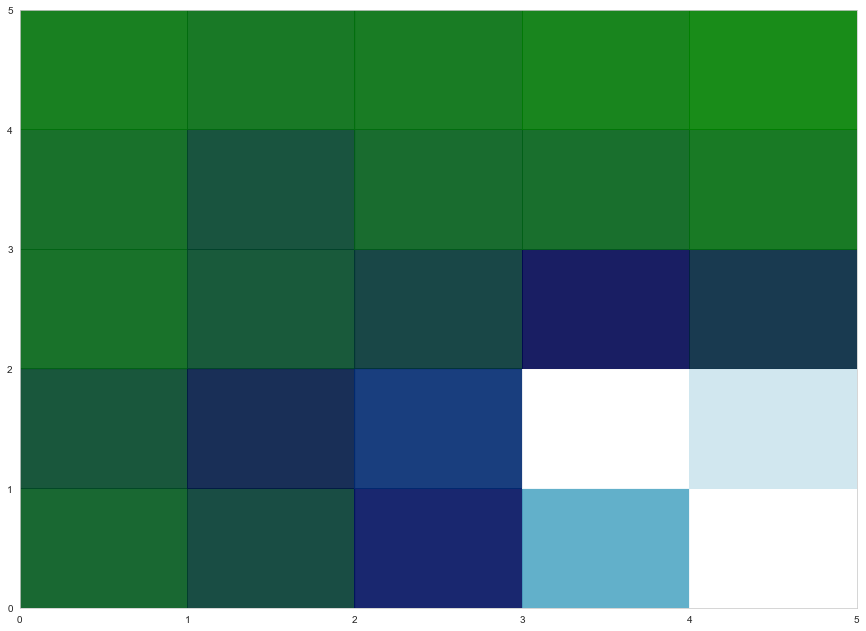

In [160]:
#Graficar grupor por distancia a cada eje
plt.figure(figsize=(15, 11))
plt.pcolor(red_neuronal_som.distance_map().T, cmap='ocean', alpha=.9)
plt.xticks(np.arange(x_dim + 1))
plt.yticks(np.arange(y_dim + 1))
plt.grid()
plt.show()

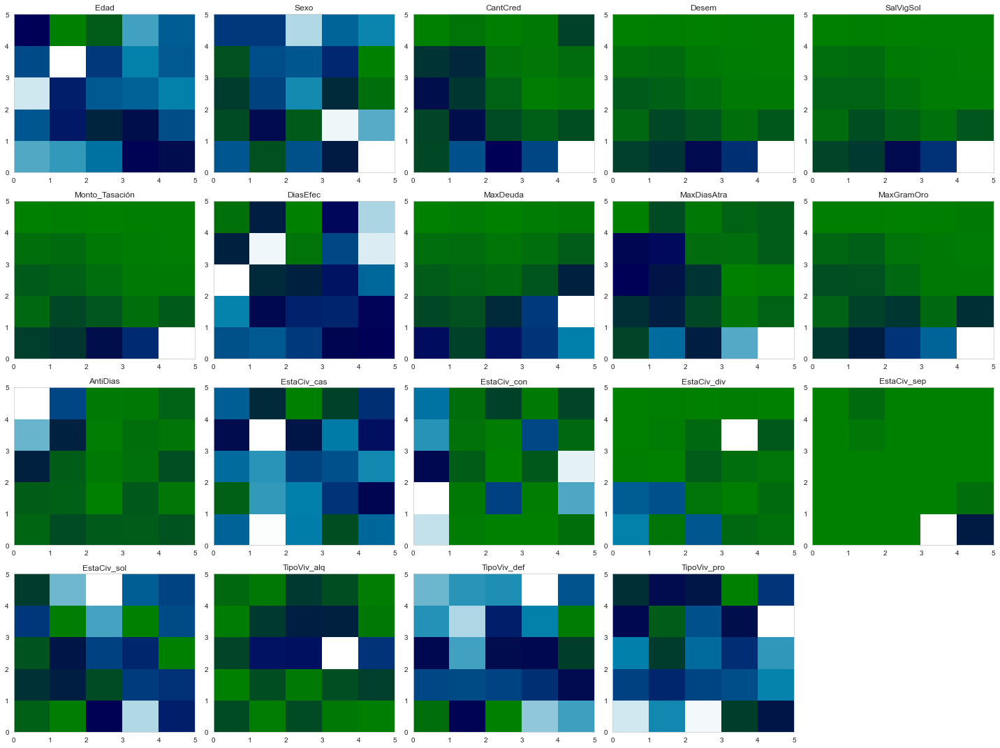

In [161]:
W = red_neuronal_som.get_weights()
plt.figure(figsize=(20, 15))
for i, f in enumerate(data_MLNS_soma):
    plt.subplot(4, 5, i+1)
    plt.title(f)
    plt.pcolor(W[:,:,i].T, cmap='ocean')
    plt.xticks(np.arange(x_dim+1))
    plt.yticks(np.arange(y_dim+1))
plt.tight_layout()
plt.show()

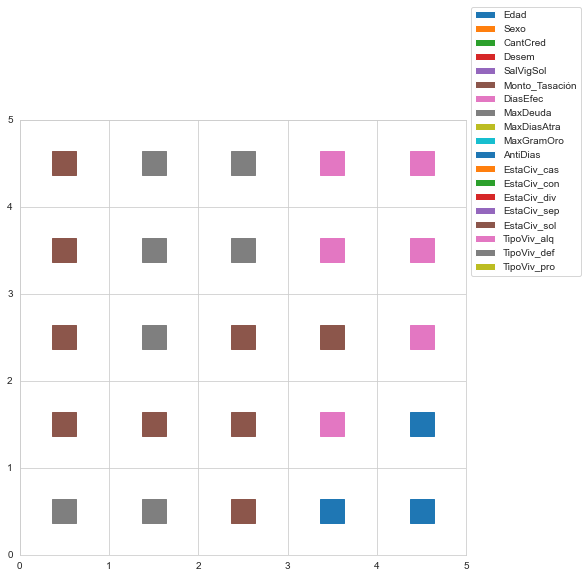

In [162]:
#Variable más representativa por cada cuadrícula
from matplotlib.patches import Patch

W = red_neuronal_som.get_weights()

Z = np.zeros((x_dim, y_dim))

plt.figure(figsize=(8, 8))
for i in np.arange(red_neuronal_som._weights.shape[0]):
    for j in np.arange(red_neuronal_som._weights.shape[1]):
        feature = np.argmax(W[i, j , :])
        plt.plot([j+.5], [i+.5], 'o', color='C'+str(feature), marker='s', markersize=24)

legend_elements = [Patch(facecolor='C'+str(i), edgecolor='w', label=f) for i, f in enumerate(data_MLNS_soma)]

plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, .95))
        
plt.xlim([0, x_dim])
plt.ylim([0, y_dim])
plt.show()

In [163]:
# each neuron represents a cluster
winner_coordinates = np.array([red_neuronal_som.winner(x) for x in df_array]).T
# with np.ravel_multi_index we convert the bidimensional coordinates to a monodimensional index
cluster_index = np.ravel_multi_index(winner_coordinates, (x_dim,y_dim))

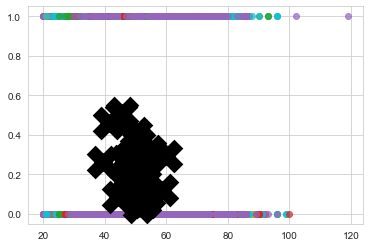

In [164]:
import matplotlib.pyplot as plt
%matplotlib inline

# plotting the clusters using the first 2 dimentions of the data
for c in np.unique(cluster_index):
    plt.scatter(df_array[cluster_index == c, 0],
                df_array[cluster_index == c, 1], label='cluster='+str(c), alpha=.7)

# plotting centroids
for centroid in red_neuronal_som.get_weights():
    plt.scatter(centroid[:, 0], centroid[:, 1], marker='x', 
                s=80, linewidths=35, color='k', label='centroid')

In [165]:
display(cluster_index)

array([15, 13, 24, ..., 24, 24,  6], dtype=int64)

In [166]:
data_MLNS_soma['Cuadrante'] = cluster_index

In [167]:
data_MLNS['Cuadrante'] = cluster_index

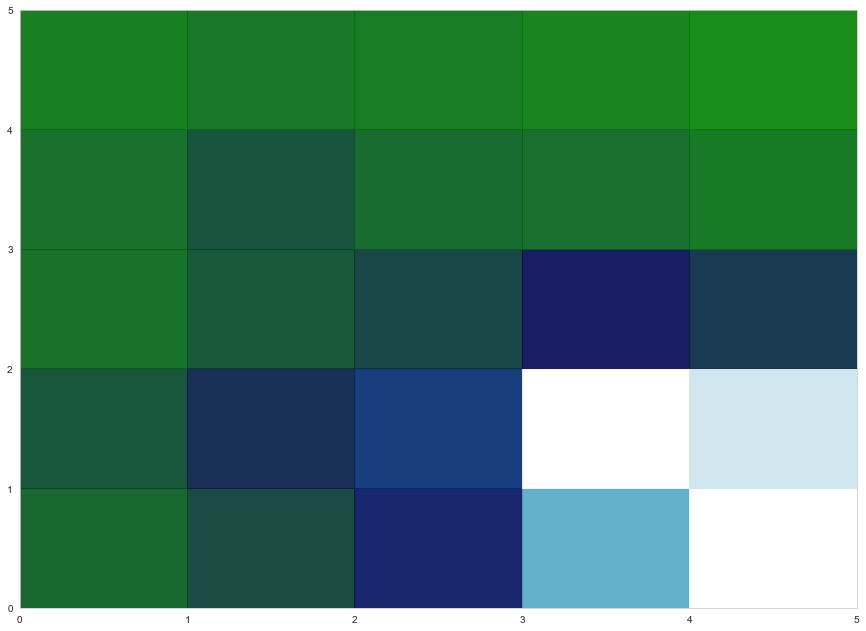

In [168]:
plt.figure(figsize=(15, 11))
plt.pcolor(red_neuronal_som.distance_map().T, cmap='ocean', alpha=.9)
plt.xticks(np.arange(x_dim + 1))
plt.yticks(np.arange(y_dim + 1))
plt.grid()
plt.show()

In [169]:
#Se agrupa contando de la esquina inferior izquierda como cero en sentido hacia arriba y despúes a la derecha
#Los números se deberan cambiar de acuerdo a los resultados anteriores

def Cluster(x):
  if x in [0,5,10,11,15,16,17,20,21,22,23,24]:
    return 1
  if x in [1,2,6,7,12,18,19]:
    return 2
  if x in [3,4,13]:
    return 3
  if x in [8,9,14]:
    return 4

In [170]:
data_MLNS_soma['Cluster0']= data_MLNS_soma['Cuadrante'].apply(lambda x: Cluster(x))

In [171]:
data_MLNS['SOM_labels']= data_MLNS['Cuadrante'].apply(lambda x: Cluster(x))

In [172]:
data_MLNS_soma.groupby('Cluster0').agg({
        'Cluster0':'count',
        'Edad':['mean','median'],
        'Sexo':['mean','median'],
        'CantCred':['mean','median'],
        'Desem':['mean','median'],
        'SalVigSol':['mean','median'],
        'Monto_Tasación':['mean','median'],
        'DiasEfec':['mean','median'],
        'MaxDeuda':['mean','median'],
        'MaxDiasAtra':['mean','median'],
        'MaxGramOro':['mean','median'],
        'AntiDias':['mean','median'],
        'EstaCiv_cas':['mean','median'],
        'EstaCiv_con':['mean','median'],
        'EstaCiv_div':['mean','median'],
        'EstaCiv_sep':['mean','median'],
        'EstaCiv_sol':['mean','median'],
        'TipoViv_alq':['mean','median'],
        'TipoViv_def':['mean','median'],
        'TipoViv_pro':['mean','median'],
        #'Actividad Laboral': lambda x: x.value_counts().index[0],
        #'Estado Civil': lambda x: x.value_counts().index[0],
        #'Nivel Educacional': lambda x: x.value_counts().index[0],
        #'Tiene Mora': lambda x: x.value_counts().index[0],
        #'Saldo Medio Anual':['mean','median'],
        #'Tiene Crédito Hipotecario': lambda x: x.value_counts().index[0],
        #'Tiene Crédito de Consumo': lambda x: x.value_counts().index[0],
        #'Medio de Contacto Preferente': lambda x: x.value_counts().index[0],
        #'Contactos con su Ejecutivo':['mean','median'],
        #'Tiene Inversiones': lambda x: x.value_counts().index[0]
    }
).reset_index().T

0            1            2            3
Cluster0                  1.000000     2.000000     3.000000     4.000000
               count   3750.000000  6638.000000  3536.000000  3825.000000
Edad           mean      52.626667    50.361855    47.095589    46.884705
               median    53.000000    50.000000    45.000000    45.000000
Sexo           mean       0.214667     0.266797     0.337104     0.324183
               median     0.000000     0.000000     0.000000     0.000000
CantCred       mean       1.619200     1.584513     1.246324     1.270850
               median     1.000000     1.000000     1.000000     1.000000
Desem          mean    2022.071533  1513.668091   846.544800   597.296875
               median   812.979980  1169.550049   815.010010   377.399994
SalVigSol      mean    1737.636108  1305.078003   752.270874   511.907043
               median   646.005005   918.025024   711.755005   324.070007
Monto_Tasación mean    2432.066650  1823.274048  1010.932495   716.626282
               median   975.349976  1407.550049   980.969971   450.000000
DiasEfec       mean    2452.627686  1575.124390   622.860901   990.240723
               median  2614.000000  1511.000000   541.000000   568.000000
MaxDeuda       mean    3759.360352  1750.406372  1015.813721   682.783142
               median  2660.100098  1516.050049   961.420044   500.000000
MaxDiasAtra    mean      25.654667    24.489756    19.277998    19.779085
               median    21.000000    21.000000    18.000000    18.000000
MaxGramOro     mean      18.207417    14.229957     8.838931     5.866573
               median     7.545000    10.500000     7.653750     3.750000
AntiDias       mean     537.218384   509.852966  1568.097534   742.818542
               median   360.000000   377.000000   541.000000   378.000000
EstaCiv_cas    mean       0.368533     0.310636     0.268948     0.243399
               median     0.000000     0.000000     0.000000     0.000000
EstaCiv_con    mean       0.036533     0.038566     0.055713     0.054118
               median     0.000000     0.000000     0.000000     0.000000
EstaCiv_div    mean       0.018667     0.017776     0.007919     0.007320
               median     0.000000     0.000000     0.000000     0.000000
EstaCiv_sep    mean       0.001867     0.002862     0.002828     0.001569
               median     0.000000     0.000000     0.000000     0.000000
EstaCiv_sol    mean       0.539733     0.601989     0.646210     0.675817
               median     1.000000     1.000000     1.000000     1.000000
TipoViv_alq    mean       0.034933     0.038716     0.054864     0.050458
               median     0.000000     0.000000     0.000000     0.000000
TipoViv_def    mean       0.452000     0.483278     0.525170     0.561307
               median     0.000000     0.000000     1.000000     1.000000
TipoViv_pro    mean       0.512000     0.476198     0.417704     0.387451
               median     1.000000     0.000000     0.000000     0.000000

### 3.5 Modelo 5 para objetivo 1: Entender el comportamiento de los clientes con el fin de que la entidad pueda generar ofertas diferenciadas, mediante una solución analítica.

### KMEANS
K-means es un algoritmo de clasificación no supervisada (clusterización) que agrupa objetos en k grupos basándose en sus características. El agrupamiento se realiza minimizando la suma de distancias entre cada objeto y el centroide de su grupo o cluster. Se suele usar la distancia cuadrática.

El algoritmo consta de tres pasos:

1. Inicialización: una vez escogido el número de grupos, k, se establecen k centroides en el espacio de los datos, por ejemplo, escogiéndolos aleatoriamente.
2. Asignación objetos a los centroides: cada objeto de los datos es asignado a su centroide más cercano.
3. Actualización centroides: se actualiza la posición del centroide de cada grupo tomando como nuevo centroide la posición del promedio de los objetos pertenecientes a dicho grupo.
![Imagen](https://www.unioviedo.es/compnum/laboratorios_py/new/d1.png)

In [173]:
#Importamos las librerias
#import seaborn as sns
#import matplotlib.pyplot as plt
#%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler     ## Transformar variables
from sklearn.decomposition import PCA               ## Componentes principales
from sklearn.mixture import GaussianMixture          ## Elección del número de cluster por BIC y AIC

In [174]:
## Se eliminan las variables que no ingresan al cluster
data_MLNS.drop(['Cuadrante'],axis=1,inplace=True) #'Cluster0'

In [175]:
#Base a usar para la clusterización:  data_MLNS
data_MLNS.info

<bound method DataFrame.info of        Edad  Sexo  CantCred         Desem     SalVigSol  Monto_Tasación  \
0      38.0   1.0       1.0  11850.000000  11850.000000    14819.000000   
1      32.0   0.0       1.0    557.179993    557.179993      655.500000   
2      39.0   0.0       2.0    375.540009    375.459991      393.239990   
3      44.0   1.0       1.0    382.190002    377.350006      450.000000   
4      59.0   1.0       1.0   1100.119995   1099.910034     1294.260010   
...     ...   ...       ...           ...           ...             ...   
17744  60.0   0.0       1.0    172.660004    170.020004      180.800003   
17745  51.0   0.0       1.0    500.029999    253.830002      606.000000   
17746  58.0   0.0       1.0    355.299988    354.519989      418.000000   
17747  60.0   0.0       2.0    955.000000    538.690002     1127.400024   
17748  38.0   0.0       2.0   3873.149902   3866.330078     4843.000000   

       DiasEfec      MaxDeuda  MaxDiasAtra  MaxGramOro  AntiDias  E

In [176]:
data_MLNS.head()

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro,SOM_labels
0,38.0,1.0,1.0,11850.000000,11850.000000,14819.00000,202.0,11850.000000,13.0,76.650002,123.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1
1,32.0,0.0,1.0,557.179993,557.179993,655.50000,177.0,900.039978,3.0,7.125000,147.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,3
2,39.0,0.0,2.0,375.540009,375.459991,393.23999,2655.0,646.500000,12.0,6.525000,221.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1
3,44.0,1.0,1.0,382.190002,377.350006,450.00000,550.0,1206.849976,0.0,3.750000,463.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4
4,59.0,1.0,1.0,1100.119995,1099.910034,1294.26001,2211.0,11244.549805,23.0,9.157500,1380.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1


In [177]:
## generamos un array con las variables
X = np.array(data_MLNS[["Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec","MaxDeuda","MaxDiasAtra","MaxGramOro","AntiDias","EstaCiv_cas","EstaCiv_con","EstaCiv_div","EstaCiv_sep","EstaCiv_sol","TipoViv_alq","TipoViv_def","TipoViv_pro"]])
X.shape

(17749, 19)

In [178]:
## generamos el algoritmo de cluster
kmeans = KMeans(n_clusters=5)

In [179]:
## ingresamos el array al algoritmo
kmeans.fit(X)

KMeans(n_clusters=5)

### Centroides

In [180]:
## centroides del cluster: son los promedio de las observaciones en cada cluster por cada variable
kmeans.cluster_centers_

array([[ 5.1928703e+01,  2.9433274e-01,  2.9140768e+00,  7.0824072e+03,
         6.3495996e+03,  8.5379531e+03,  1.8197955e+03,  8.0347295e+03,
         4.6778793e+01,  6.1826942e+01,  6.5850464e+02,  3.6197442e-01,
         4.3875676e-02,  2.5594149e-02,  5.4844636e-03,  5.4478973e-01,
         4.3875676e-02,  4.0402198e-01,  5.5210233e-01],
       [ 4.9018181e+01,  2.8612110e-01,  1.2523212e+00,  6.7685272e+02,
         5.7621875e+02,  8.1172229e+02,  1.3238652e+03,  1.0537711e+03,
         1.9691557e+01,  6.8240356e+00,  8.0677460e+02,  2.9137757e-01,
         4.6433546e-02,  1.1316370e-02,  2.4823043e-03,  6.2575728e-01,
         4.4316269e-02,  5.1733965e-01,  4.3724892e-01],
       [ 4.8500000e+01,  1.0000000e+00,  1.8000000e+01,  7.9206477e+04,
         7.9206469e+04,  9.3268648e+04,  5.5500000e+01,  1.2756000e+04,
         2.0550000e+02,  5.8356281e+02,  1.4055000e+03,  5.0000000e-01,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  5.0000000e-01,
         0.0000000e+00

In [181]:
## Etiquetas de cada observación, esto se logra con los centroides
kmeans.labels_

array([0, 1, 1, ..., 1, 1, 3])

In [182]:
## Se convierte en un DataFrame el X y se le agrega etiquetas
column_names = ["Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec","MaxDeuda",
                "MaxDiasAtra","MaxGramOro","AntiDias","EstaCiv_cas","EstaCiv_con","EstaCiv_div",
                "EstaCiv_sep","EstaCiv_sol","TipoViv_alq","TipoViv_def","TipoViv_pro"]
data_MLNS_real=pd.DataFrame(X,columns=column_names)
# convert all columns of DataFrame
data_MLNS_real = data_MLNS_real.apply(pd.to_numeric) # convert all columns of DataFrame
data_MLNS_real.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Edad            17749 non-null  float32
 1   Sexo            17749 non-null  float32
 2   CantCred        17749 non-null  float32
 3   Desem           17749 non-null  float32
 4   SalVigSol       17749 non-null  float32
 5   Monto_Tasación  17749 non-null  float32
 6   DiasEfec        17749 non-null  float32
 7   MaxDeuda        17749 non-null  float32
 8   MaxDiasAtra     17749 non-null  float32
 9   MaxGramOro      17749 non-null  float32
 10  AntiDias        17749 non-null  float32
 11  EstaCiv_cas     17749 non-null  float32
 12  EstaCiv_con     17749 non-null  float32
 13  EstaCiv_div     17749 non-null  float32
 14  EstaCiv_sep     17749 non-null  float32
 15  EstaCiv_sol     17749 non-null  float32
 16  TipoViv_alq     17749 non-null  float32
 17  TipoViv_def     17749 non-null 

In [183]:
## A cada observación en la data se le coloca las equiquetas del cluster
data_MLNS_re = pd.concat([data_MLNS_real,pd.DataFrame({'kmeans_labels':kmeans.labels_})],axis=1)

In [184]:
data_MLNS_re.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17749 entries, 0 to 17748
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Edad            17749 non-null  float32
 1   Sexo            17749 non-null  float32
 2   CantCred        17749 non-null  float32
 3   Desem           17749 non-null  float32
 4   SalVigSol       17749 non-null  float32
 5   Monto_Tasación  17749 non-null  float32
 6   DiasEfec        17749 non-null  float32
 7   MaxDeuda        17749 non-null  float32
 8   MaxDiasAtra     17749 non-null  float32
 9   MaxGramOro      17749 non-null  float32
 10  AntiDias        17749 non-null  float32
 11  EstaCiv_cas     17749 non-null  float32
 12  EstaCiv_con     17749 non-null  float32
 13  EstaCiv_div     17749 non-null  float32
 14  EstaCiv_sep     17749 non-null  float32
 15  EstaCiv_sol     17749 non-null  float32
 16  TipoViv_alq     17749 non-null  float32
 17  TipoViv_def     17749 non-null 

In [185]:
#Para comparar después
data_MLNS = pd.concat([data_MLNS,pd.DataFrame({'kmeans_labels':kmeans.labels_})],axis=1)

In [186]:
data_MLNS

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,...,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro,SOM_labels,kmeans_labels
0,38.0,1.0,1.0,11850.000000,11850.000000,14819.000000,202.0,11850.000000,13.0,76.650002,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1,0
1,32.0,0.0,1.0,557.179993,557.179993,655.500000,177.0,900.039978,3.0,7.125000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,3,1
2,39.0,0.0,2.0,375.540009,375.459991,393.239990,2655.0,646.500000,12.0,6.525000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1,1
3,44.0,1.0,1.0,382.190002,377.350006,450.000000,550.0,1206.849976,0.0,3.750000,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4,1
4,59.0,1.0,1.0,1100.119995,1099.910034,1294.260010,2211.0,11244.549805,23.0,9.157500,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17744,60.0,0.0,1.0,172.660004,170.020004,180.800003,707.0,240.000000,28.0,3.000000,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4,1
17745,51.0,0.0,1.0,500.029999,253.830002,606.000000,1599.0,500.029999,21.0,4.150000,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2,1
17746,58.0,0.0,1.0,355.299988,354.519989,418.000000,2852.0,355.299988,23.0,2.850000,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1,1
17747,60.0,0.0,2.0,955.000000,538.690002,1127.400024,4198.0,927.549988,52.0,7.665000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,1


In [187]:
data_MLNS_re

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro,kmeans_labels
0,38.0,1.0,1.0,11850.000000,11850.000000,14819.000000,202.0,11850.000000,13.0,76.650002,123.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0
1,32.0,0.0,1.0,557.179993,557.179993,655.500000,177.0,900.039978,3.0,7.125000,147.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1
2,39.0,0.0,2.0,375.540009,375.459991,393.239990,2655.0,646.500000,12.0,6.525000,221.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1
3,44.0,1.0,1.0,382.190002,377.350006,450.000000,550.0,1206.849976,0.0,3.750000,463.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4,59.0,1.0,1.0,1100.119995,1099.910034,1294.260010,2211.0,11244.549805,23.0,9.157500,1380.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17744,60.0,0.0,1.0,172.660004,170.020004,180.800003,707.0,240.000000,28.0,3.000000,308.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
17745,51.0,0.0,1.0,500.029999,253.830002,606.000000,1599.0,500.029999,21.0,4.150000,350.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
17746,58.0,0.0,1.0,355.299988,354.519989,418.000000,2852.0,355.299988,23.0,2.850000,764.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
17747,60.0,0.0,2.0,955.000000,538.690002,1127.400024,4198.0,927.549988,52.0,7.665000,1164.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1


In [188]:
## Se cuentan los valores por cada cluster: se puede observar que los cluster son asimétricos, esto se debe a los 
## puntos extremos, debería mejorar con el tratamiento de datos
data_MLNS_re['kmeans_labels'].value_counts()

1    13704
3     3459
0      547
4       37
2        2
Name: kmeans_labels, dtype: int64

In [189]:
## Calculamos los promedios por cada Cluster
data_MLNS_re.groupby('kmeans_labels').mean()

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
kmeans_labels,,,,,,,,,,,,,,,,,,,
0,51.928703,0.294333,2.914077,7082.407227,6349.599609,8537.954102,1819.795410,8034.729492,46.778793,61.826931,658.504578,0.361974,0.043876,0.025594,0.005484,0.544790,0.043876,0.404022,0.552102
1,49.013939,0.286121,1.252627,677.286560,576.599731,812.223633,1323.836182,1054.539062,19.691696,6.827765,806.511902,0.291375,0.046556,0.011311,0.002481,0.625657,0.044294,0.517367,0.437245
2,48.500000,1.000000,18.000000,79206.468750,79206.468750,93268.648438,55.500000,12756.000000,205.500000,583.562866,1405.500000,0.500000,0.000000,0.000000,0.000000,0.500000,0.000000,0.500000,0.500000
3,50.747326,0.263371,1.972535,2520.286865,2174.085938,3036.485840,1864.619507,3588.006592,29.802256,23.460636,677.061279,0.324949,0.038740,0.021683,0.001446,0.575889,0.041631,0.454177,0.500723
4,48.432434,0.351351,6.459459,23698.453125,20102.369141,28329.195312,1514.250000,17230.650391,98.648651,181.780197,747.027039,0.270270,0.027027,0.000000,0.000000,0.675676,0.000000,0.648649,0.351351


In [190]:
data_MLNS_re.groupby('kmeans_labels').var()

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
kmeans_labels,,,,,,,,,,,,,,,,,,,
0,166.773300,0.208081,6.954142,7.255996e+06,6.991512e+06,1.068688e+07,1.437198e+06,2.872335e+07,2783.099365,1069.110352,542720.750,0.231372,0.042027,0.024985,0.005464,0.248448,0.042027,0.241229,0.247738
1,194.417450,0.204271,0.391696,1.827769e+05,1.551268e+05,2.681813e+05,1.070794e+06,5.448136e+05,258.841309,22.062241,1121091.750,0.206491,0.044392,0.011183,0.002475,0.234227,0.042335,0.249717,0.246080
2,684.500000,0.000000,200.000000,8.635947e+07,8.635947e+07,1.170986e+08,1.250000e+01,2.617472e+06,16380.500000,4666.986328,3685612.500,0.500000,0.000000,0.000000,0.000000,0.500000,0.000000,0.500000,0.500000
3,197.944229,0.194063,2.051009,1.179260e+06,1.115445e+06,1.757915e+06,1.361702e+06,5.060426e+06,677.291687,157.795273,556036.375,0.219421,0.037250,0.021219,0.001444,0.244311,0.039909,0.247972,0.250072
4,162.085587,0.234234,49.810810,6.841940e+07,7.000737e+07,9.268203e+07,8.447372e+05,1.458419e+08,9796.623047,3422.040771,614744.250,0.202703,0.027027,0.000000,0.000000,0.225225,0.000000,0.234234,0.234234


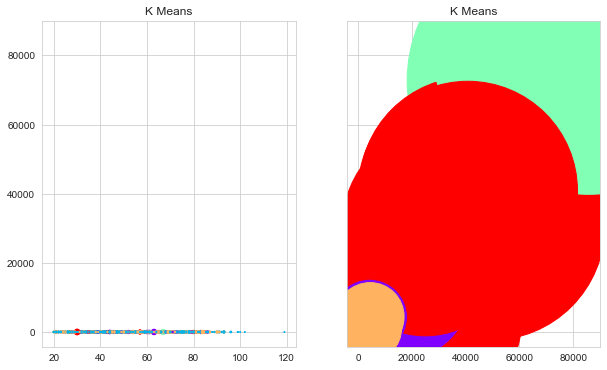

In [191]:
f, (ax1,ax2) = plt.subplots(1,2, sharey=True,figsize=(10,6))
ax1.set_title('K Means')
ax1.scatter(X[:, 0], X[:, 1], X[:, 2],c=kmeans.labels_,cmap='rainbow')
ax2.set_title('K Means')
ax2.scatter(X[:, 3], X[:, 4], X[:, 5],c=kmeans.labels_,cmap='rainbow');

### 3 componentes principales

In [192]:
#from sklearn.decomposition import PCA

In [193]:
pca = PCA(n_components=3)

In [194]:
pca.fit(X)

PCA(n_components=3)

In [195]:
x_pca = pca.transform(X)

In [196]:
X.shape #Original

(17749, 19)

In [237]:
X

array([[3.8000000e+01, 1.0000000e+00, 1.0000000e+00, 1.1850000e+04,
        1.1850000e+04, 1.4819000e+04, 2.0200000e+02, 1.1850000e+04,
        1.3000000e+01, 7.6650002e+01, 1.2300000e+02, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 1.0000000e+00],
       [3.2000000e+01, 0.0000000e+00, 1.0000000e+00, 5.5717999e+02,
        5.5717999e+02, 6.5550000e+02, 1.7700000e+02, 9.0003998e+02,
        3.0000000e+00, 7.1250000e+00, 1.4700000e+02, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [3.9000000e+01, 0.0000000e+00, 2.0000000e+00, 3.7554001e+02,
        3.7545999e+02, 3.9323999e+02, 2.6550000e+03, 6.4650000e+02,
        1.2000000e+01, 6.5250001e+00, 2.2100000e+02, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [4.4000000e+01,

In [197]:
x_pca.shape  #Con 3 componentes principales

(17749, 3)

In [238]:
x_pca

array([[ 2.23502012e+04, -5.05629791e+02,  2.04395850e+03],
       [-1.58188501e+03,  3.65375946e+02,  9.18795288e+02],
       [-1.92217810e+03,  1.57640060e+02, -1.43298926e+03],
       [-1.73658984e+03, -6.17220268e+01,  7.06564697e+02],
       [ 3.70589209e+03, -8.61435059e+03,  8.06731079e+02],
       [-7.08616028e+02,  2.39016327e+02, -5.60372864e+02],
       [-7.14781616e+02,  1.88114548e+02,  7.00698914e+02],
       [ 1.74353531e+02, -1.30428149e+03, -2.51897751e+02],
       [-2.26739624e+03,  6.87588196e+02,  7.76896606e+02],
       [-1.92352844e+03,  9.18205200e+02,  1.57231689e+03],
       [-1.76942871e+03,  1.34147949e+02, -1.18641516e+03],
       [-1.13911938e+03,  2.19883072e+02, -2.55138092e+02],
       [-6.92181885e+02, -4.70036743e+02, -2.02420764e+03],
       [-2.26197046e+03,  8.11664978e+02,  1.22433289e+03],
       [ 6.68694141e+03,  1.02325116e+03, -1.22224037e+02],
       [-8.52259216e+02, -1.77209427e+02,  2.64252148e+01],
       [-9.81748352e+02, -3.18635498e+02

### 5means 3 componentes principales

In [198]:
kmeans = KMeans(n_clusters=5)

In [199]:
kmeans.fit(x_pca)

KMeans(n_clusters=5)

### Centroides

In [200]:
kmeans.cluster_centers_
### El segundo cluster presenta la mayor cantidad de clientes 
### cluster 2: 2do componente 

array([[ 2.9331208e+03, -5.0345409e+01, -2.6307712e+02],
       [ 1.4558754e+04,  9.3659192e+02,  1.4199500e+02],
       [ 5.6724855e+04,  7.0849253e+03,  1.3955466e+03],
       [ 5.5600508e+03, -7.6826558e+03,  7.4911859e+02],
       [-1.3040482e+03,  1.8242055e+02,  3.3949387e+01]], dtype=float32)

In [201]:
kmeans.labels_

array([1, 4, 4, ..., 4, 4, 0])

C:\Users\Mauro\anaconda3\lib\site-packages\matplotlib\collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


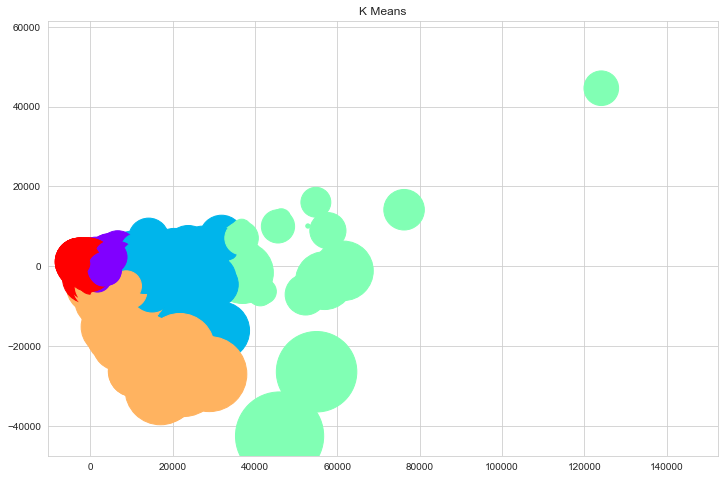

In [202]:
f, (ax1_pca) = plt.subplots(1, sharey=True,figsize=(12,8))
ax1_pca.set_title('K Means')
ax1_pca.scatter(x_pca[:, 0], x_pca[:, 1], x_pca[:, 2],c=kmeans.labels_,cmap='rainbow');

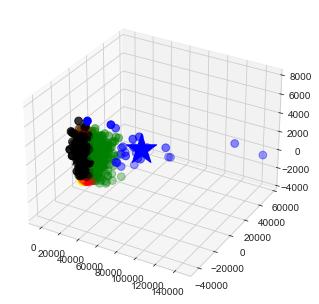

In [203]:
from mpl_toolkits.mplot3d import Axes3D
# Predicting the clusters
labels = kmeans.predict(x_pca)
# Getting the cluster centers
C = kmeans.cluster_centers_
colores=['red','green','blue','black','yellow']
asignar=[]
for row in labels:
    asignar.append(colores[row])
 
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(x_pca[:, 0], x_pca[:, 1], x_pca[:, 2], c=asignar,s=60)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c=colores, s=1000);

In [204]:
copy =  pd.DataFrame()
copy['label'] = labels;
cantidadGrupo =  pd.DataFrame()
cantidadGrupo['color']=colores
cantidadGrupo['cantidad']=copy.groupby('label').size()
cantidadGrupo

,color,cantidad
0,red,3167
1,green,358
2,blue,25
3,black,374
4,yellow,13825


In [205]:
pca.components_
###En esta matriz numerosa, cada fila representa un componente principal y cada columna
###se relaciona con las características originales.

array([[ 1.76191330e-04,  2.13816151e-07,  1.39616590e-04,
         5.04785538e-01,  4.51211870e-01,  6.04768276e-01,
         3.98150459e-02,  4.17257309e-01,  2.03152350e-03,
         4.10837401e-03, -1.20351324e-02,  3.99493956e-06,
        -9.33375929e-07,  9.65682602e-07,  4.31855263e-08,
        -4.73921364e-06, -6.98238296e-07, -5.30896932e-06,
         5.92213291e-06],
       [-2.31584272e-04,  1.28745314e-05,  1.47736835e-04,
         2.22408041e-01,  2.40209997e-01,  2.62694180e-01,
        -1.16374806e-01, -8.95991206e-01,  2.07623746e-03,
         1.37919339e-03,  8.64629596e-02, -8.10181245e-06,
         1.44789865e-07, -1.55876819e-06, -1.67309182e-07,
         1.17674945e-05,  7.04419676e-07,  1.16762294e-05,
        -1.24244170e-05],
       [-3.82318371e-03,  6.47559064e-05, -2.30506863e-04,
        -2.06363108e-02,  1.82801634e-02, -2.67777424e-02,
        -9.46064472e-01,  1.42618969e-01, -3.71518405e-03,
        -5.26199728e-05,  2.88299114e-01, -6.09247836e-05,
    

In [206]:
data_MLNS.keys()

Index(['Edad', 'Sexo', 'CantCred', 'Desem', 'SalVigSol', 'Monto_Tasación',
       'DiasEfec', 'MaxDeuda', 'MaxDiasAtra', 'MaxGramOro', 'AntiDias',
       'EstaCiv_cas', 'EstaCiv_con', 'EstaCiv_div', 'EstaCiv_sep',
       'EstaCiv_sol', 'TipoViv_alq', 'TipoViv_def', 'TipoViv_pro',
       'SOM_labels', 'kmeans_labels'],
      dtype='object')

In [207]:
df_comp = pd.DataFrame(pca.components_,columns=['Edad', 'Sexo', 'CantCred', 'Desem', 'SalVigSol', 'Monto_Tasación',
       'DiasEfec', 'MaxDeuda', 'MaxDiasAtra', 'MaxGramOro', 'AntiDias',
       'EstaCiv_cas', 'EstaCiv_con', 'EstaCiv_div', 'EstaCiv_sep',
       'EstaCiv_sol', 'TipoViv_alq', 'TipoViv_def', 'TipoViv_pro'])
df_comp
### Contribución de cada variable a los componentes respectivos

,Edad,Sexo,CantCred,Desem,SalVigSol,Monto_Tasación,DiasEfec,MaxDeuda,MaxDiasAtra,MaxGramOro,AntiDias,EstaCiv_cas,EstaCiv_con,EstaCiv_div,EstaCiv_sep,EstaCiv_sol,TipoViv_alq,TipoViv_def,TipoViv_pro
0,0.000176,2.138162e-07,0.000140,0.504786,0.451212,0.604768,0.039815,0.417257,0.002032,0.004108,-0.012035,0.000004,-9.333759e-07,9.656826e-07,4.318553e-08,-0.000005,-6.982383e-07,-0.000005,0.000006
1,-0.000232,1.287453e-05,0.000148,0.222408,0.240210,0.262694,-0.116375,-0.895991,0.002076,0.001379,0.086463,-0.000008,1.447899e-07,-1.558768e-06,-1.673092e-07,0.000012,7.044197e-07,0.000012,-0.000012
2,-0.003823,6.475591e-05,-0.000231,-0.020636,0.018280,-0.026778,-0.946064,0.142619,-0.003715,-0.000053,0.288299,-0.000061,6.172591e-06,-2.288867e-06,-1.788992e-08,0.000069,1.322694e-05,0.000030,-0.000045


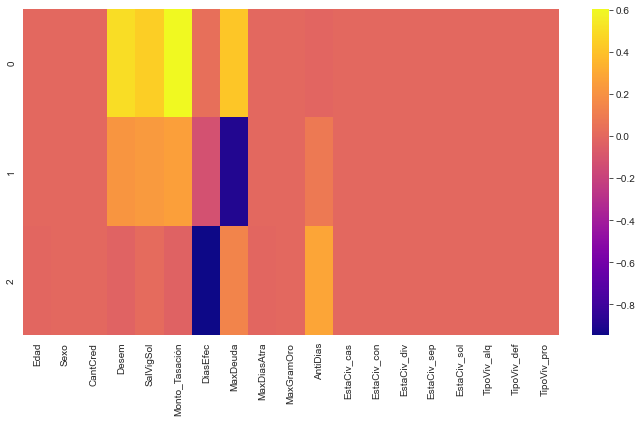

In [208]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap='plasma',);
### A que componenetes estan asociadas las variables
### Segunda componente: Cyzone y Maquillaje

### Método del codo

### Para base en niveles

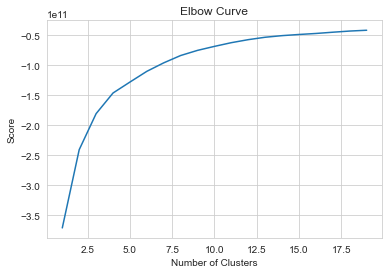

In [209]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

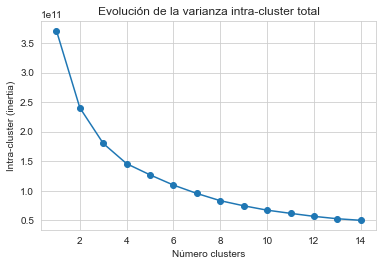

In [210]:
range_n_clusters = range(1, 15)
inertias = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    modelo_kmeans.fit(X)
    inertias.append(modelo_kmeans.inertia_)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, inertias, marker='o')
ax.set_title("Evolución de la varianza intra-cluster total")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Intra-cluster (inertia)');
### El número óptimo de clusters sería 4

### Para componentes principales

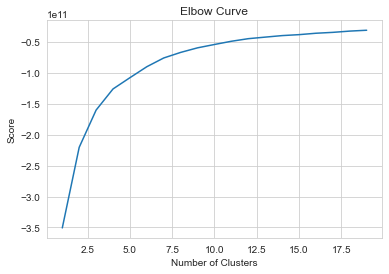

In [211]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(x_pca).score(x_pca) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

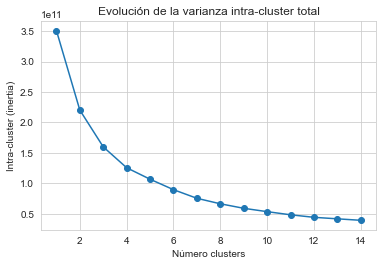

In [212]:
range_n_clusters = range(1, 15)
inertias = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    modelo_kmeans.fit(x_pca)
    inertias.append(modelo_kmeans.inertia_)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, inertias, marker='o')
ax.set_title("Evolución de la varianza intra-cluster total")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Intra-cluster (inertia)');
### El número óptimo de clusters sería 4

### Según AIC y BIC

In [213]:
from sklearn.mixture import GaussianMixture

### Para base en niveles

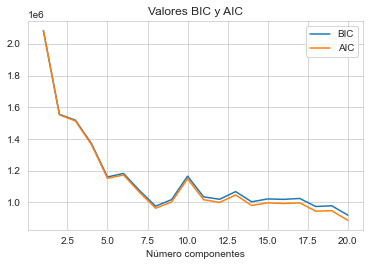

In [214]:
n_components = range(1, 21)
#n_components = range(1, 10)
valores_bic = []
valores_aic = []

for i in n_components:
    modelo = GaussianMixture(n_components=i, covariance_type="full",reg_covar=1e-5)
    #modelo = GaussianMixture(n_components=i, covariance_type="full")
    modelo = modelo.fit(X)
    valores_bic.append(modelo.bic(X))
    valores_aic.append(modelo.aic(X))

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(n_components, valores_bic, label='BIC')
ax.plot(n_components, valores_aic, label='AIC')
ax.set_title("Valores BIC y AIC")
ax.set_xlabel("Número componentes")
ax.legend();

In [215]:
print(f"Número óptimo acorde al BIC: {range(1, 21)[np.argmin(valores_bic)]}")
print(f"Número óptimo acorde al AIC: {range(1, 21)[np.argmin(valores_aic)]}")

Número óptimo acorde al BIC: 20
Número óptimo acorde al AIC: 20


### Para componentes principales

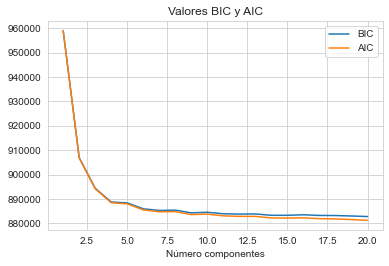

In [216]:
n_components = range(1, 21)
#n_components = range(1, 10)
valores_bic = []
valores_aic = []

for i in n_components:
    modelo = GaussianMixture(n_components=i, covariance_type="full",reg_covar=1e-5)
    #modelo = GaussianMixture(n_components=i, covariance_type="full")
    modelo = modelo.fit(x_pca)
    valores_bic.append(modelo.bic(x_pca))
    valores_aic.append(modelo.aic(x_pca))

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(n_components, valores_bic, label='BIC')
ax.plot(n_components, valores_aic, label='AIC')
ax.set_title("Valores BIC y AIC")
ax.set_xlabel("Número componentes")
ax.legend();

In [217]:
print(f"Número óptimo acorde al BIC: {range(1, 21)[np.argmin(valores_bic)]}")
print(f"Número óptimo acorde al AIC: {range(1, 21)[np.argmin(valores_aic)]}")

Número óptimo acorde al BIC: 20
Número óptimo acorde al AIC: 20


Según el criterio de AIC/BIC nos recomiendo una cantidad excesiva de clusters, lo cual es razonable ya que así disminuye su error.

### 3.6 Modelo 6 para objetivo 1: Entender el comportamiento de los clientes con el fin de que la entidad pueda generar ofertas diferenciadas, mediante una solución analítica.

### Gaussian Mixture Model
En esta Sección presentamos formalmente los modelos Gaussianos Mixtos.

Sea X = {X1,X2,…,Xn} una muestra i.i.d. proveniente de una distribución de probabilidad mixta de K componentes, definida por:

f(xi|π,θ)=∑k=1Kπkϕk(x|θk).
Donde

K es el número de clusters.

0<πk≤1 ∀k∈{1,…,K} y ∑Kk=1πk=1.

θk es el conjunto de parámetros de la función de la k- ésima función de densidad.

A πk lo interpretamos como la probabilidad de que la observación Xi provenga de la densidad ϕk.

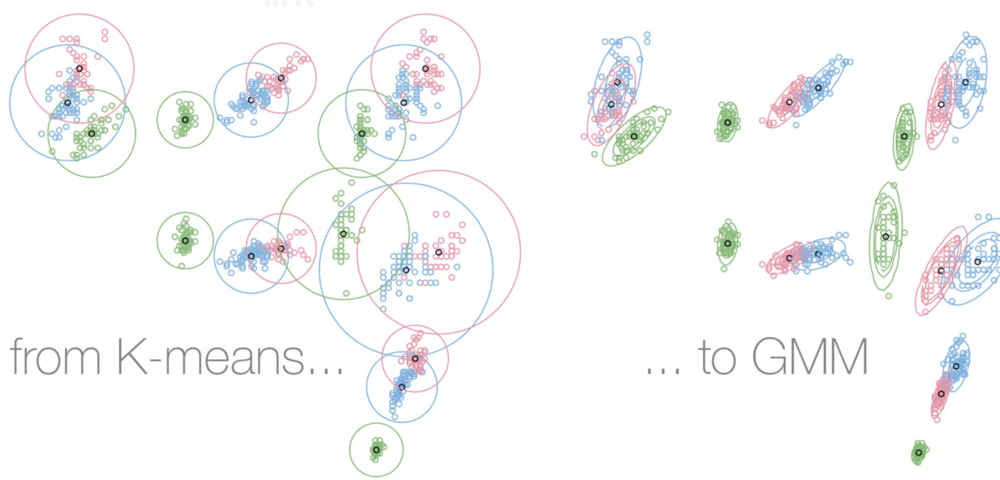

In [218]:
#Importamos librerias
import numpy as np
#import matplotlib as mpl
#import matplotlib.pyplot as plt
#import pandas as pd
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

#import matplotlib.pyplot as plt
#import matplotlib.cm as cm
#import numpy as np

In [219]:
## generamos un array con las variables
X_gmm = np.array(data_MLNS[["Edad","Sexo","CantCred","Desem","SalVigSol","Monto_Tasación","DiasEfec",
                            "MaxDeuda","MaxDiasAtra","MaxGramOro","AntiDias","EstaCiv_cas","EstaCiv_con",
                            "EstaCiv_div","EstaCiv_sep","EstaCiv_sol","TipoViv_alq","TipoViv_def","TipoViv_pro"]])

### Componentes principales

In [220]:
from sklearn.preprocessing import StandardScaler #utilizado para la estandarización

In [221]:
#Estandarización
sc=StandardScaler()
X_gmm_standard=sc.fit_transform(X_gmm)

In [222]:
pca = PCA(n_components=2)
pca.fit(X_gmm_standard)
X_gmm_std = pca.transform(X_gmm_standard)


In [231]:
#gaaa

In [242]:
pca

PCA(n_components=2)

In [227]:
import sys
np.set_printoptions(threshold=sys.maxsize)

In [243]:
#X_gmm

In [244]:
#X_gmm_standard

In [234]:
X_gmm_std

array([[ 9.47662640e+00,  1.98293424e+00],
       [-1.36823773e+00,  2.04722643e+00],
       [-8.92376781e-01,  1.36520147e+00],
       [-1.28796959e+00, -1.65585458e-01],
       [ 9.09789979e-01, -1.08859599e-01],
       [-3.91464710e-01, -7.58591652e-01],
       [-4.91644889e-01, -1.87292337e+00],
       [-3.17498207e-01,  1.16599321e+00],
       [-1.37307847e+00,  1.79993796e+00],
       [-1.22158515e+00,  3.92651260e-02],
       [-6.63190186e-01, -3.15709877e+00],
       [-5.03477335e-01, -2.91065067e-01],
       [-3.33430350e-01, -1.91765642e+00],
       [-1.17202938e+00, -2.27057981e+00],
       [ 4.55008793e+00, -1.33596718e-01],
       [-2.86667228e-01, -6.48568332e-01],
       [-4.17638630e-01, -1.10980558e+00],
       [ 1.43926013e+00,  1.26725245e+00],
       [-1.13601208e+00, -1.98587090e-01],
       [ 1.67389488e+00, -1.41346765e+00],
       [ 5.55435300e-01, -3.11912155e+00],
       [ 5.62319100e-01, -2.45190096e+00],
       [ 9.12812114e-01,  1.58114600e+00],
       [-5.

In [ ]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=5,covariance_type="full", n_init=10, random_state=42)
gm.fit(X_gmm_std)

In [ ]:
X_gmm_cluster=gm.predict(X_gmm_std)

In [ ]:
#gaaa
# Picking the Model
model_file = "model_gmm.pickle" #Pickle de gridsearch de LightGBM
pickle.dump(gm, open(model_file,'wb'))
#scaler_file = "sc.pickle"
#pickle.dump(sc, open(scaler_file,'wb'))

In [ ]:
X_gmm_std

In [ ]:
data_MLNS=pd.concat([data_MLNS,pd.DataFrame({'gmm_labels':X_gmm_cluster})],axis=1)
data_MLNS.head(5)

In [ ]:
data_MLNS['gmm_labels'].value_counts()

In [ ]:
data_MLNS['SOM_labels'].value_counts()

In [ ]:
data_MLNS['kmeans_labels'].value_counts()

Grafiquemos las fronteras de decisión y los contornos de densidad obtenidos por el modelo.

In [ ]:
from matplotlib.colors import LogNorm

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)
    
def plot_gaussian_mixture(clusterer, X_gmm_std, resolution=1000, show_ylabels=True):
    mins = X_gmm_std.min(axis=0) - 0.1
    maxs = X_gmm_std.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z,
                 norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12))
    plt.contour(xx, yy, Z,
                norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12),
                linewidths=1, colors='k')

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z,
                linewidths=2, colors='w', linestyles='dashed')
    
    plt.plot(X_gmm_std[:, 0], X_gmm_std[:, 1], 'k.', markersize=2)
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("$x_1$", fontsize=14)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
        
def compare_gaussian_mixtures(gm1, gm2, X_gmm_std):
    plt.figure(figsize=(9, 4))

    plt.subplot(121)
    plot_gaussian_mixture(gm1, X_gmm_std)
    plt.title('covariance_type="{}"'.format(gm1.covariance_type), fontsize=14)

    plt.subplot(122)
    plot_gaussian_mixture(gm2, X_gmm_std, show_ylabels=False)
    plt.title('covariance_type="{}"'.format(gm2.covariance_type), fontsize=14)

In [ ]:
plt.figure(figsize=(8, 4))
plot_gaussian_mixture(gm, X_gmm_std)
plt.show()

Como se vió en clase, es posible restringir las matrices de covarianza usando el parámetro covariance_type:

* "full" (por defecto): sin restricción, los clusters pueden tomar cualquier forma elipsoidal.
* "tied": los clusters deben tener la misma forma que puede ser cualquier elipsoide.
* "spherical": los clusters deben ser esféricos, solo varía el diámetro.
* "diag": los clusters pueden tener cualquier forma elipsoidal pero los ejes de la elipse deben ser paralelos a los ejes.

In [ ]:
gm_full = GaussianMixture(n_components=3, n_init=10, covariance_type="full", random_state=42)

gm_tied = GaussianMixture(n_components=3, n_init=10, covariance_type="tied", random_state=42)

gm_spherical = GaussianMixture(n_components=3, n_init=10, covariance_type="spherical", random_state=42)

gm_diag = GaussianMixture(n_components=3, n_init=10, covariance_type="diag", random_state=42)

gm_full.fit(X_gmm_std)
gm_tied.fit(X_gmm_std)
gm_spherical.fit(X_gmm_std)
gm_diag.fit(X_gmm_std)

In [ ]:
compare_gaussian_mixtures(gm_tied, gm_spherical, X_gmm_std)
plt.show()

In [ ]:
compare_gaussian_mixtures(gm_full, gm_diag, X_gmm_std)
plt.tight_layout()
plt.show()

### Detección de anomalías usando GMM

GMM puede usarse para detectar anomalías, basta explorar las instancias ubicadas en zonas de baja densidad. Se debe definir un límite de densidad para diferenciar una anomalía. Por ejemplo, si se conoce que 4% es la tasa de productos defectuosos en una fábrica, se puede usar como límite el valor de densidad que mantenga el 4% de instancias fuera.

In [ ]:
# Cálculo del límite de densidad que permite descartar el 4% de las instancias.
densities = gm.score_samples(X_gmm_std)
density_threshold = np.percentile(densities, 4)
anomalies = X[densities < density_threshold]

Podemos imprimir las anomalías respecto a las fronteras de decisión y los contornos de densidad obtenidos por el modelo.

In [ ]:
plt.figure(figsize=(8, 4))

plot_gaussian_mixture(gm, X_gmm_std)
plt.scatter(anomalies[:, 0], anomalies[:, 1], color='b', marker='x')
plt.ylim(top=5.1)

plt.show()

### GMM: Métricas de evaluación

Las métricas de evaluación revisadas para el algoritmo GMM son Bayesian information criterion (BIC) y Akaike information criterion (AIC). Se utilizarán estas métricas para detectar gráficamente el mejor valor de k para el conjunto de datos trabajado previamente. También se utilizará gridsearch para encontrar el mejor valor de k y covariance_type en base a la métrica BIC.

#Entrenamiento de modelos GMM para k ∈ {1,2,3, ... ,11}

In [ ]:
gms_per_k = [GaussianMixture(n_components=k, n_init=10, random_state=42).fit(X_gmm_std)
             for k in range(1, 11)]

In [ ]:
#Calculo de métricas BIC y AIC para cada modelo.
bics = [model.bic(X_gmm_std) for model in gms_per_k]
aics = [model.aic(X_gmm_std) for model in gms_per_k]

In [ ]:
#Gráfica de los indicadores BIC y AIC para cada valor de k.
plt.figure(figsize=(8, 3))
plt.plot(range(1, 11), bics, "bo-", label="BIC")
plt.plot(range(1, 11), aics, "go--", label="AIC")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Information Criterion", fontsize=14)
plt.axis([1, 9.5, np.min(aics) - 50, np.max(aics) + 50])
plt.annotate('Minimum',
             xy=(3, bics[2]),
             xytext=(0.35, 0.6),
             textcoords='figure fraction',
             fontsize=14,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.legend()
plt.show()

In [ ]:
#Se utiliza gridsearch para determinar el mejor valor de k y covariance_type.
min_bic = np.infty

for k in range(1, 5):
    for covariance_type in ("full", "tied", "spherical", "diag"):
        bic = GaussianMixture(n_components=k, n_init=10,
                              covariance_type=covariance_type,
                              random_state=42).fit(X).bic(X)
        if bic < min_bic:
            min_bic = bic
            best_k = k
            best_covariance_type = covariance_type

In [ ]:
best_k,best_covariance_type

### Bayesian Gaussian Mixture Model

En vez de realizar una búsqueda manual del número de clusters, se puede utilizar la clase BayesianGaussianMixture. Este modelo parte de un número inicial de componentes (que debe ser mayor al número de clusters) y asigna un peso de 0 a los componentes innecesarios. Podemos volver a experimentar con el conjunto de datos asumiendo que el número de componentes es menor a 10.

In [ ]:
from sklearn.mixture import BayesianGaussianMixture

bgm = BayesianGaussianMixture(n_components=10, n_init=10, random_state=42)
bgm.fit(X_gmm_std)

In [ ]:
#Si revisamos los pesos del modelo, vemos que ha descartado 2 clusters, manteniendo solo 8.
np.round(bgm.weights_, 2)

In [ ]:
#Podemos graficar nuevamente las fronteras de decisión y los contornos de densidad obtenidos por el modelo.
plt.figure(figsize=(8, 5))
plot_gaussian_mixture(bgm, X_gmm_std)
plt.show()

In [ ]:
data_MLNS

### Pendiente
Correr el mejor modelo de Machine learning supervisado en el DF de data de ultimo mes y tomar un umbral de probabilidad de que se adjudique el bien, sobre eso generarlos modelos no supervisados.

Por ahora trabajamos con data_MLNS_soma